# EVALUATION

In [1]:
#!/usr/bin/env python
# coding: utf-8

import importlib
import evaluation_plot_utils
import data_preparation
importlib.reload(evaluation_plot_utils)

import tensorflow as tf
import time
import pandas as pd
import os
import re
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt
from IPython.display import display, Image

from sklearn.preprocessing import MinMaxScaler

import evaluation_plot_utils
import data_preparation
import lagged_cov_models
import seasonal_cov_models
importlib.reload(evaluation_plot_utils)
importlib.reload(data_preparation)
importlib.reload(lagged_cov_models)
importlib.reload(seasonal_cov_models)

<module 'seasonal_cov_models' from 'C:\\Users\\34648\\OneDrive - Generalitat de Catalunya\\Escriptori\\waikato\\seasonal_cov_models.py'>

### PARAMETERS

In [2]:
code = "J00"
forecast = 7
lookback = 14
ff_dim = 8
learning_rate = 0.001

model_name = f'{code}_example_transformer_{forecast}fh_{ff_dim}ff_{lookback}lb_{learning_rate}initlr'

##### Prepare test data

In [3]:
start_time = time.perf_counter()
input_directory = "C:/Users/34648/OneDrive - Generalitat de Catalunya/Escriptori/waikato/"

csvFile = f'{input_directory}diagnostic_data/{code}_test_example.csv'

# prepare X and Y arrays
X_test, Y_test = data_preparation.prepare_data(f'{input_directory}diagnostic_data/{code}_test_example.csv', lookback, forecast, debug=True, univariate =True)
date_list = data_preparation.extract_dates(f'{input_directory}diagnostic_data/{code}_test_example.csv', lookback, forecast)

finish_preparing = time.perf_counter()
time_data_preparation = finish_preparing - start_time
print("finished preparing data, time spent:",time_data_preparation)
print("finished preparing timesteps, time spent:",len(date_list))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840 entries, 0 to 839
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   timestamp  840 non-null    object 
 1   J00        840 non-null    float64
dtypes: float64(1), object(1)
memory usage: 13.2+ KB
Processed Data Shapes: X=(820, 14, 1), Y=(820, 7)
finished preparing data, time spent: 0.1961063999999908
finished preparing timesteps, time spent: 820


##### Add pandemic wave data

In [4]:
waves = {
    "Primera Onada": ("2020-03", "2020-06"),
    "Segona Onada": ("2020-10", "2020-12"),
    "Tercera Onada": ("2021-01", "2021-03"),
    "Quarta Onada": ("2021-04", "2021-06"),
    #"Cinquena Onada": ("2021-07", "2021-09")
}

# Convertir a DataFrame per facilitar la representació
df_waves = pd.DataFrame(waves).T.reset_index()
df_waves.columns = ["Onada", "Inici", "Final"]
df_waves["Inici"] = pd.to_datetime(df_waves["Inici"])
df_waves["Final"] = pd.to_datetime(df_waves["Final"])

##### Extract and inspect model

In [5]:
model_name = f'{code}_example_transformer_{forecast}fh_{ff_dim}ff_{lookback}lb_{learning_rate}initlr'
print(model_name)
base_path = "C:/Users/34648/OneDrive - Generalitat de Catalunya/Escriptori/waikato/univariate_models/"

# Get available folders
available_folders = [f for f in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, f))]
print("Available model folders:", available_folders)

# Automatically select the correct one
for folder in available_folders:
    if model_name in folder:  # Check the pattern
        full_path = os.path.join(base_path, folder)
        print(f"✅ Using detected model folder: {folder}")
        break
else:
    print("❌ No matching folder found!")
    full_path = None

# Load the model if a valid path was found
if full_path:
    import tensorflow as tf
    model = tf.keras.models.load_model(full_path)
    model.summary()

J00_example_transformer_7fh_8ff_14lb_0.001initlr
Available model folders: ['COV-19_example_transformer_14fh_8ff_14lb_0.001initlr', 'COV-19_example_transformer_14fh_8ff_182lb_0.001initlr', 'COV-19_example_transformer_14fh_8ff_1lb_0.001initlr', 'COV-19_example_transformer_14fh_8ff_30lb_0.001initlr', 'COV-19_example_transformer_14fh_8ff_365lb_0.001initlr', 'COV-19_example_transformer_14fh_8ff_60lb_0.001initlr', 'COV-19_example_transformer_14fh_8ff_7lb_0.001initlr', 'COV-19_example_transformer_182fh_8ff_14lb_0.001initlr', 'COV-19_example_transformer_182fh_8ff_182lb_0.001initlr', 'COV-19_example_transformer_182fh_8ff_1lb_0.001initlr', 'COV-19_example_transformer_182fh_8ff_30lb_0.001initlr', 'COV-19_example_transformer_182fh_8ff_365lb_0.001initlr', 'COV-19_example_transformer_182fh_8ff_60lb_0.001initlr', 'COV-19_example_transformer_182fh_8ff_7lb_0.001initlr', 'COV-19_example_transformer_1fh_8ff_14lb_0.001initlr', 'COV-19_example_transformer_1fh_8ff_182lb_0.001initlr', 'COV-19_example_transfo

Model: "model_96"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_97 (InputLayer)          [(None, 14, 1)]      0           []                               
                                                                                                  
 layer_normalization_384 (Layer  (None, 14, 1)       2           ['input_97[0][0]']               
 Normalization)                                                                                   
                                                                                                  
 multi_head_attention_192 (Mult  (None, 14, 1)       29          ['layer_normalization_384[0][0]',
 iHeadAttention)                                                  'layer_normalization_384[0][0]']
                                                                                           

#### Predict

In [6]:
# Get predictions
predictions = model.predict(X_test)
print("Predicted values:", predictions.shape)
print("Predicted values:", Y_test.shape)

Predicted values: (820, 7)
Predicted values: (820, 7)


##### Evaluate performance over each predicted timestep

🔹 **Average MSE:** 0.0042
🔹 **Average MAE:** 0.0395
🔹 **Average Bias:** 0.0063
🔹 **Average CRPS:** 0.0042
🔹 **Average Pinball Loss:** 0.0198
🔹 **Average SMAPE:** 41.34%


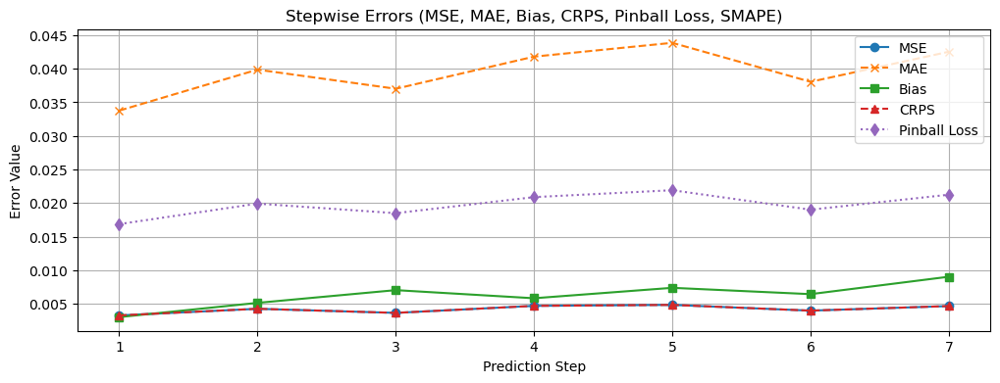

In [7]:
evaluation_plot_utils.plot_stepwise_errors(Y_test, predictions)

##### General model prediction

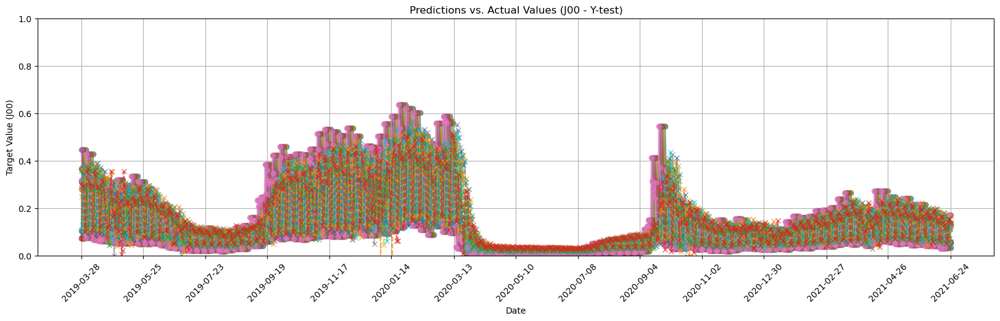

In [8]:
# Call the function with formatted dates
evaluation_plot_utils.plot_predictions_with_waves(Y_test, predictions, date_list, df_waves, waves=False)

#### a. Predict the first timestep from the  multiple timestep forecasting

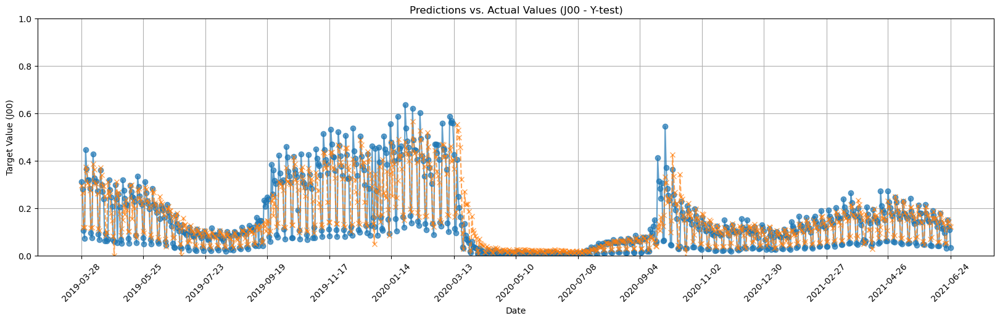

🔹 **Average MSE:** 0.0033
🔹 **Average MAE:** 0.0338
🔹 **Average Bias:** 0.0030
🔹 **Average CRPS:** 0.0033
🔹 **Average Pinball Loss:** 0.0169


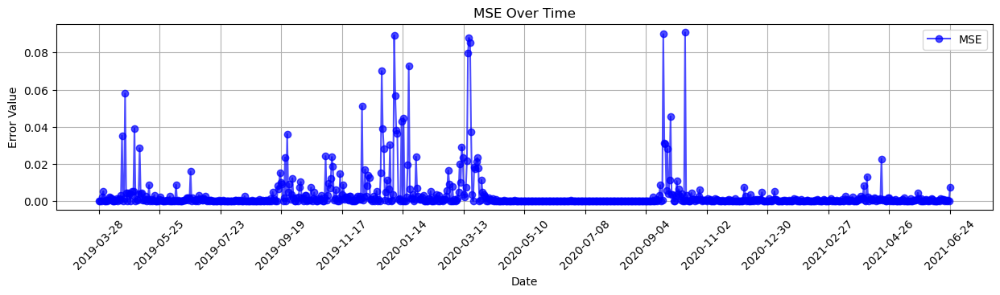

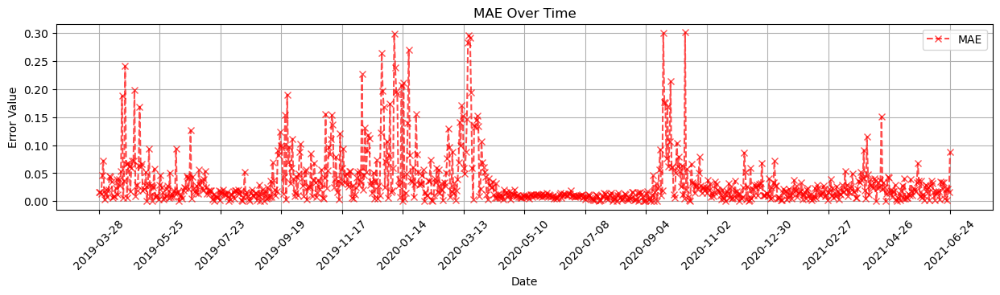

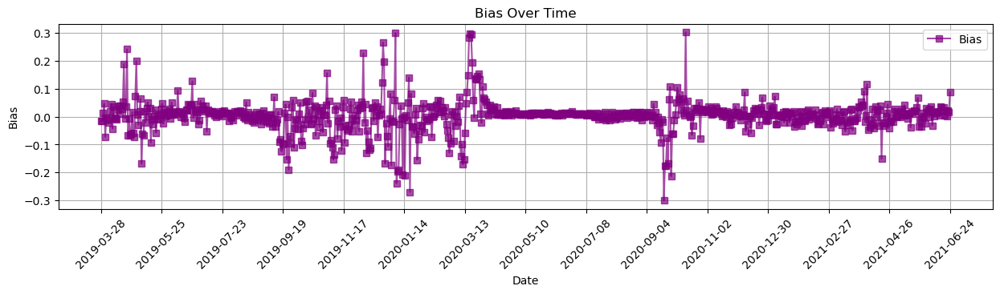

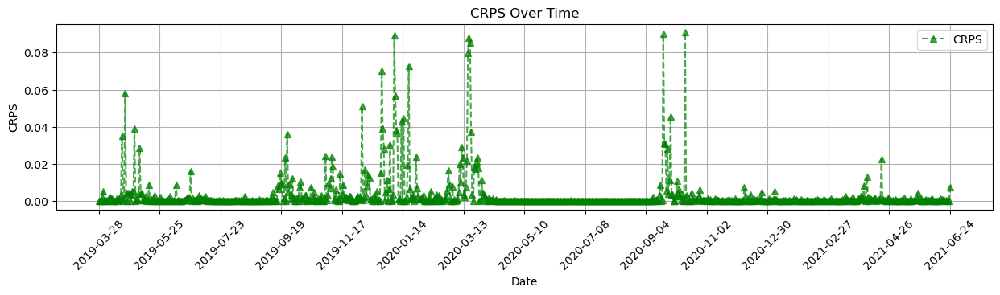

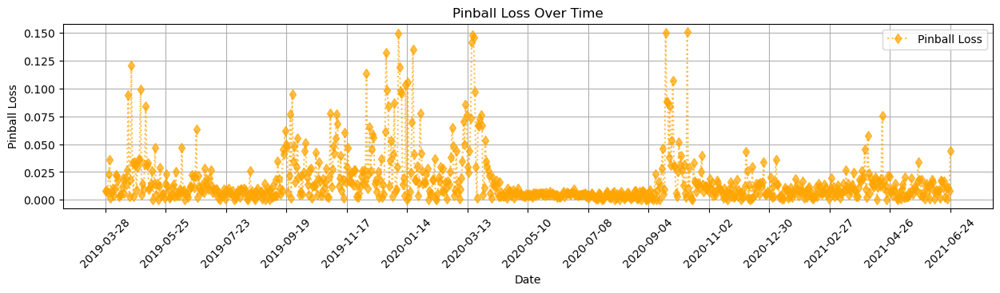


📊 **Results for MSE:**
🔹 Inside Pandemic Waves: Mean=0.0030, Std=0.0111, N=277
🔹 Outside Pandemic Waves: Mean=0.0035, Std=0.0102, N=543
✅ **Welch’s t-test:** t=-0.5742, p=0.5661
✅ **Mann-Whitney U test:** U=71979.0000, p=0.3146
🟢 No significant difference in errors (Welch’s t-test, p >= 0.05)
🟢 No significant difference in errors (Mann-Whitney U test, p >= 0.05)

📊 **Results for MAE:**
🔹 Inside Pandemic Waves: Mean=0.0309, Std=0.0452, N=277
🔹 Outside Pandemic Waves: Mean=0.0352, Std=0.0471, N=543
✅ **Welch’s t-test:** t=-1.2833, p=0.1999
✅ **Mann-Whitney U test:** U=71979.0000, p=0.3146
🟢 No significant difference in errors (Welch’s t-test, p >= 0.05)
🟢 No significant difference in errors (Mann-Whitney U test, p >= 0.05)

📊 **Results for Bias:**
🔹 Inside Pandemic Waves: Mean=0.0148, Std=0.0527, N=277
🔹 Outside Pandemic Waves: Mean=-0.0030, Std=0.0587, N=543
✅ **Welch’s t-test:** t=4.3970, p=0.0000
✅ **Mann-Whitney U test:** U=87617.0000, p=0.0001
🔴 **Significant difference in errors (

In [9]:
predictions_to_plot = predictions[:, 0]
Y_test_to_plot = Y_test[:,0]

# Call the function with formatted dates
evaluation_plot_utils.plot_predictions_with_waves(Y_test_to_plot, predictions_to_plot, date_list, df_waves, waves=False)

evaluation_plot_utils.plot_errors_over_time_with_waves(Y_test_to_plot, predictions_to_plot, date_list, df_waves, waves=False)

evaluation_plot_utils.evaluate_error_significance_pandemic_waves(Y_test_to_plot, predictions_to_plot, date_list, df_waves)

#### b. Predict the last timestep from the  multiple timestep forecasting

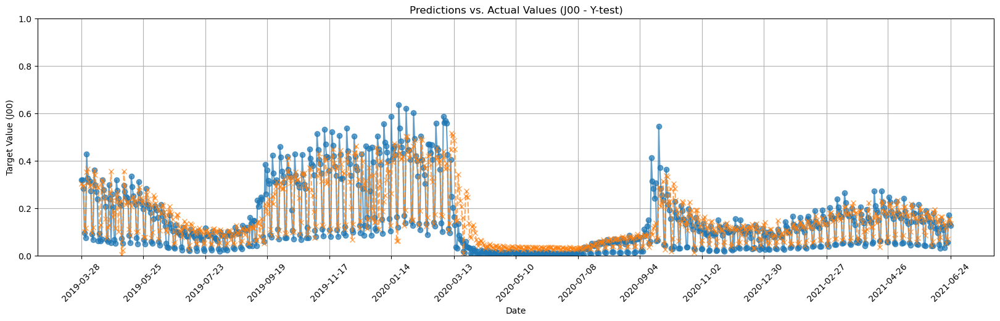

🔹 **Average MSE:** 0.0047
🔹 **Average MAE:** 0.0425
🔹 **Average Bias:** 0.0091
🔹 **Average CRPS:** 0.0047
🔹 **Average Pinball Loss:** 0.0213


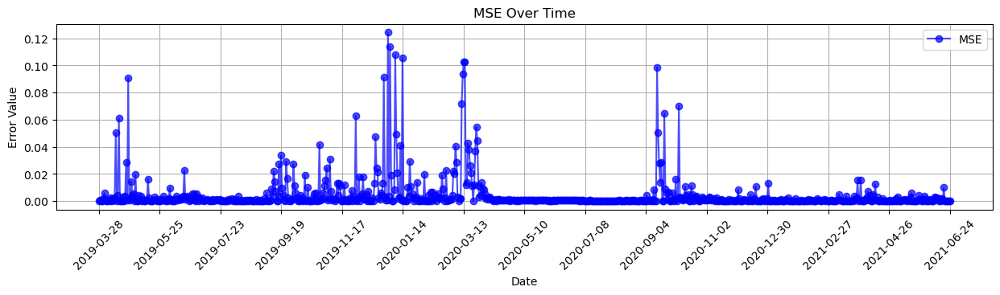

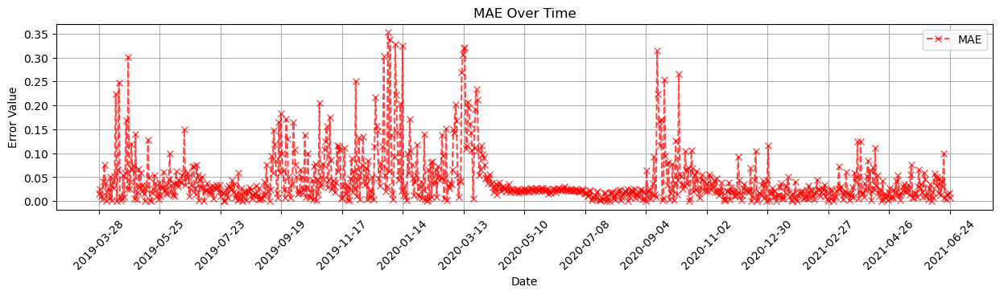

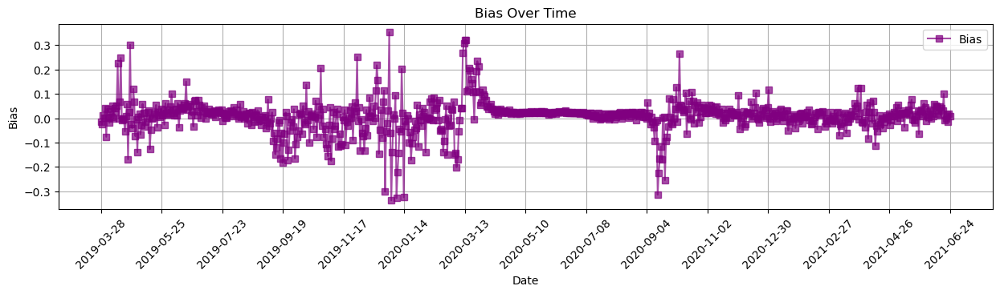

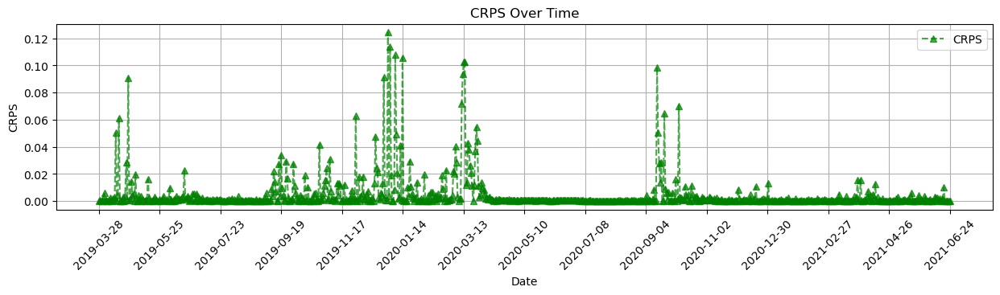

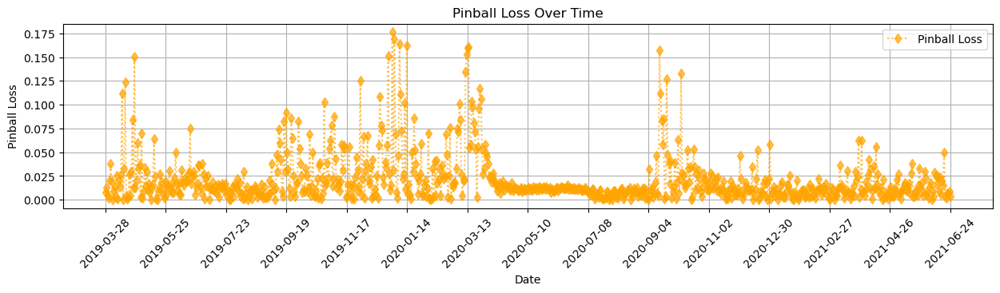


📊 **Results for MSE:**
🔹 Inside Pandemic Waves: Mean=0.0043, Std=0.0136, N=277
🔹 Outside Pandemic Waves: Mean=0.0049, Std=0.0142, N=543
✅ **Welch’s t-test:** t=-0.5672, p=0.5708
✅ **Mann-Whitney U test:** U=74887.0000, p=0.9210
🟢 No significant difference in errors (Welch’s t-test, p >= 0.05)
🟢 No significant difference in errors (Mann-Whitney U test, p >= 0.05)

📊 **Results for MAE:**
🔹 Inside Pandemic Waves: Mean=0.0403, Std=0.0518, N=277
🔹 Outside Pandemic Waves: Mean=0.0436, Std=0.0546, N=543
✅ **Welch’s t-test:** t=-0.8526, p=0.3942
✅ **Mann-Whitney U test:** U=74887.0000, p=0.9210
🟢 No significant difference in errors (Welch’s t-test, p >= 0.05)
🟢 No significant difference in errors (Mann-Whitney U test, p >= 0.05)

📊 **Results for Bias:**
🔹 Inside Pandemic Waves: Mean=0.0264, Std=0.0601, N=277
🔹 Outside Pandemic Waves: Mean=0.0002, Std=0.0699, N=543
✅ **Welch’s t-test:** t=5.5640, p=0.0000
✅ **Mann-Whitney U test:** U=92295.0000, p=0.0000
🔴 **Significant difference in errors (W

In [10]:
predictions_to_plot = predictions[:, -1] 
Y_test_to_plot = Y_test[:,-1]

# Call the function with formatted dates
evaluation_plot_utils.plot_predictions_with_waves(Y_test_to_plot, predictions_to_plot, date_list, df_waves, waves=False)

evaluation_plot_utils.plot_errors_over_time_with_waves(Y_test_to_plot, predictions_to_plot, date_list, df_waves, waves=False)

evaluation_plot_utils.evaluate_error_significance_pandemic_waves(Y_test_to_plot, predictions_to_plot, date_list, df_waves)

#### c. Predict the average val from the  multiple timestep forecasting

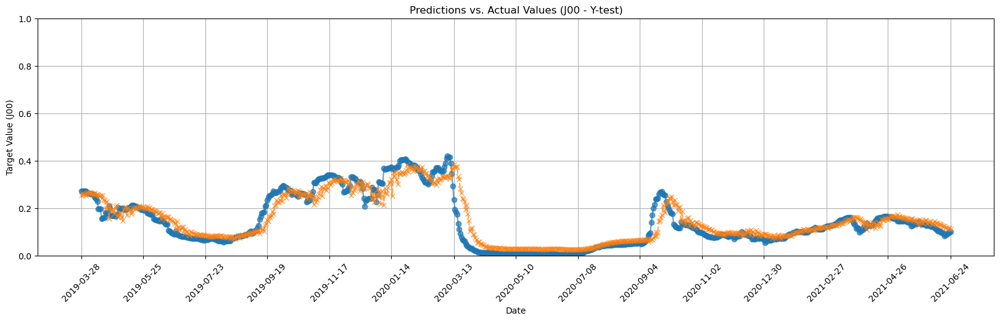

🔹 **Average MSE:** 0.0018
🔹 **Average MAE:** 0.0281
🔹 **Average Bias:** 0.0063
🔹 **Average CRPS:** 0.0018
🔹 **Average Pinball Loss:** 0.0140


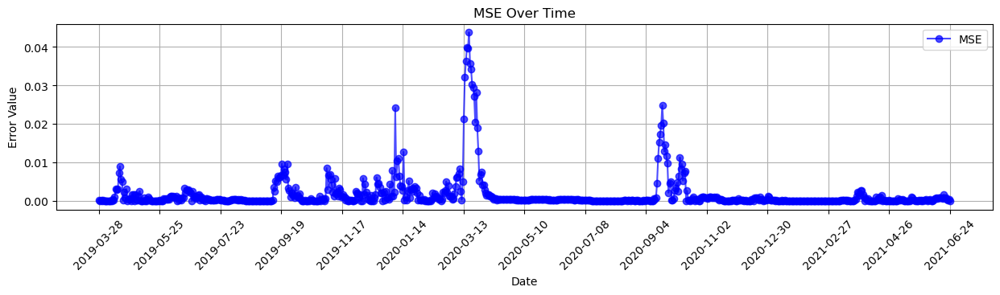

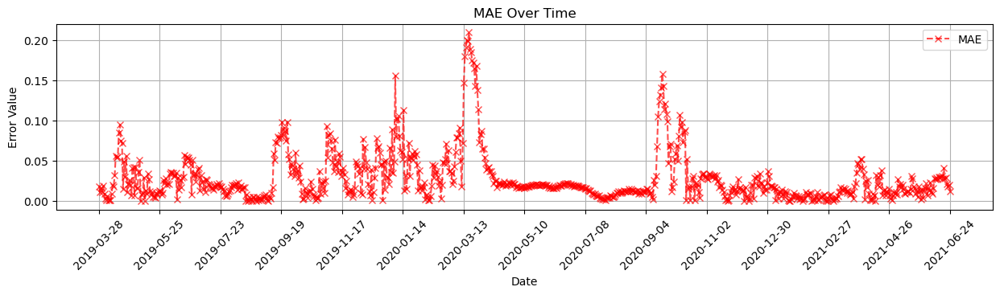

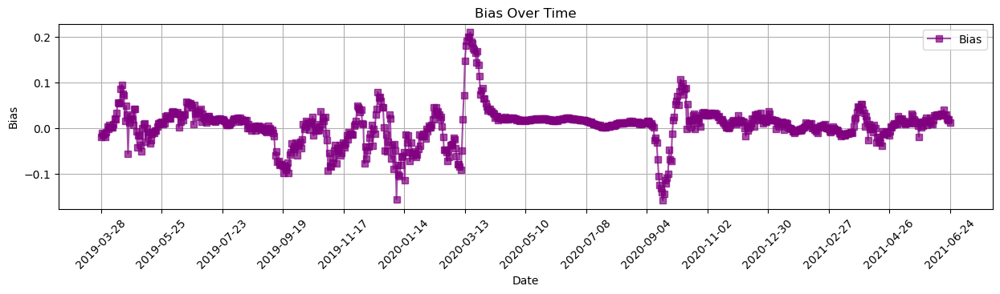

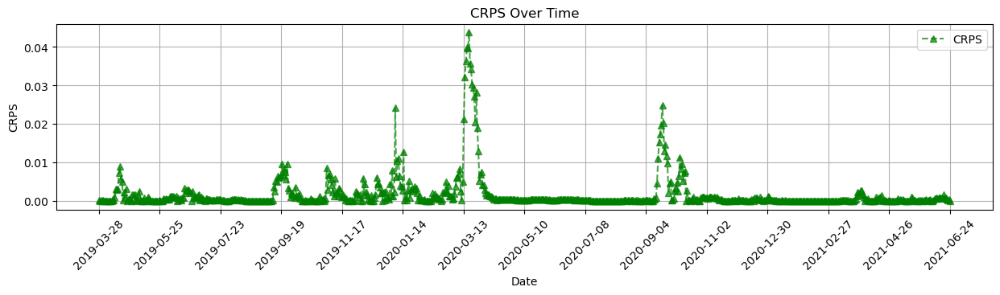

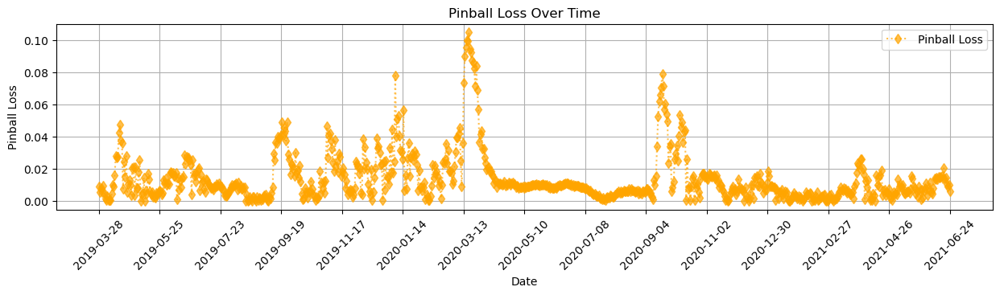


📊 **Results for MSE:**
🔹 Inside Pandemic Waves: Mean=0.0025, Std=0.0071, N=277
🔹 Outside Pandemic Waves: Mean=0.0014, Std=0.0029, N=543
✅ **Welch’s t-test:** t=2.3318, p=0.0203
✅ **Mann-Whitney U test:** U=71494.0000, p=0.2473
🔴 **Significant difference in errors (Welch’s t-test, p < 0.05)**
🟢 No significant difference in errors (Mann-Whitney U test, p >= 0.05)

📊 **Results for MAE:**
🔹 Inside Pandemic Waves: Mean=0.0297, Std=0.0397, N=277
🔹 Outside Pandemic Waves: Mean=0.0272, Std=0.0260, N=543
✅ **Welch’s t-test:** t=0.9247, p=0.3557
✅ **Mann-Whitney U test:** U=71494.0000, p=0.2473
🟢 No significant difference in errors (Welch’s t-test, p >= 0.05)
🟢 No significant difference in errors (Mann-Whitney U test, p >= 0.05)

📊 **Results for Bias:**
🔹 Inside Pandemic Waves: Mean=0.0225, Std=0.0441, N=277
🔹 Outside Pandemic Waves: Mean=-0.0020, Std=0.0376, N=543
✅ **Welch’s t-test:** t=7.8830, p=0.0000
✅ **Mann-Whitney U test:** U=95295.0000, p=0.0000
🔴 **Significant difference in errors (We

In [11]:
predictions_to_plot = predictions.mean(axis=1) 
Y_test_to_plot = Y_test.mean(axis=1)

# Call the function with formatted dates
evaluation_plot_utils.plot_predictions_with_waves(Y_test_to_plot, predictions_to_plot, date_list, df_waves, waves=False)

evaluation_plot_utils.plot_errors_over_time_with_waves(Y_test_to_plot, predictions_to_plot, date_list, df_waves, waves=False)

evaluation_plot_utils.evaluate_error_significance_pandemic_waves(Y_test_to_plot, predictions_to_plot, date_list, df_waves)

### Single Look_back period analysis

✅ Loaded model: J00_example_transformer_1fh_8ff_14lb_0.001initlr
1
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840 entries, 0 to 839
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   timestamp  840 non-null    object 
 1   J00        840 non-null    float64
dtypes: float64(1), object(1)
memory usage: 13.2+ KB
Processed Data Shapes: X=(826, 14, 1), Y=(826, 1)
✅ Loaded model: J00_example_transformer_7fh_8ff_14lb_0.001initlr
7
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840 entries, 0 to 839
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   timestamp  840 non-null    object 
 1   J00        840 non-null    float64
dtypes: float64(1), object(1)
memory usage: 13.2+ KB
Processed Data Shapes: X=(820, 14, 1), Y=(820, 7)
✅ Loaded model: J00_example_transformer_14fh_8ff_14lb_0.001initlr
14
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840 entries, 

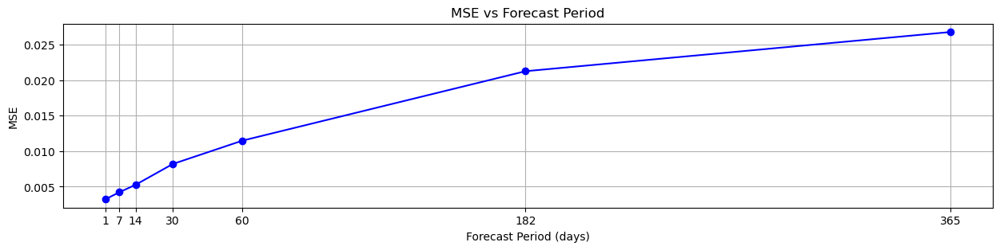

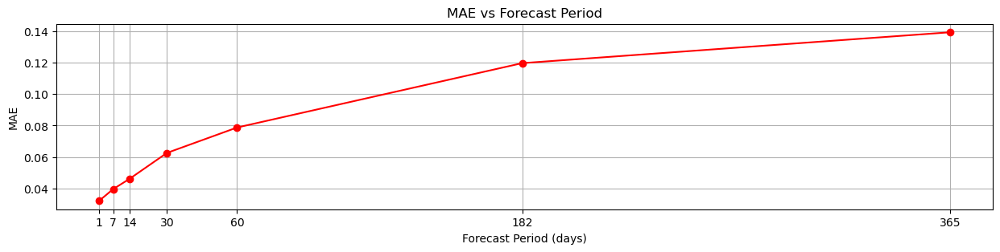

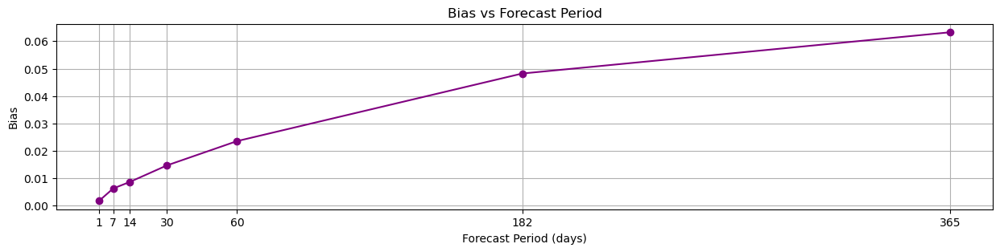

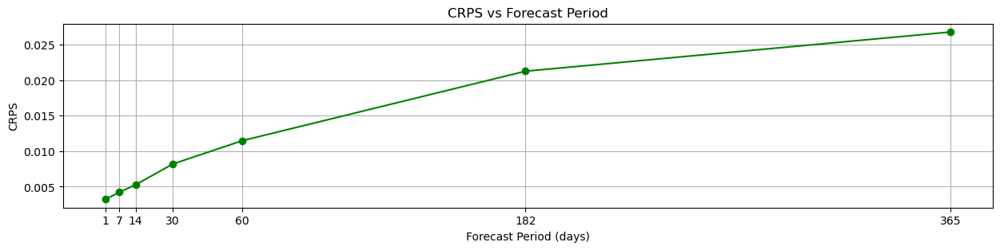

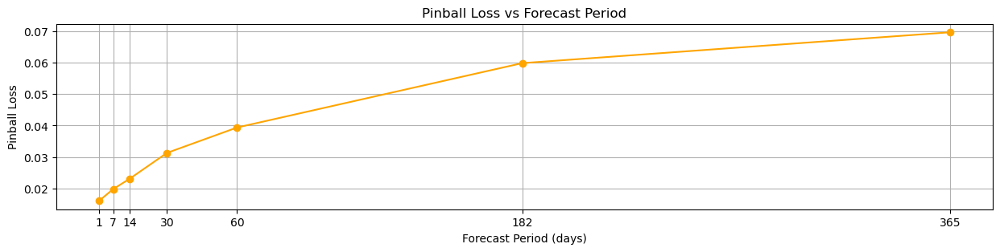

In [12]:
# Model directory path
base_path = "C:/Users/34648/OneDrive - Generalitat de Catalunya/Escriptori/waikato/univariate_models/"

failed_models = {}

# List of available model folders
model_folders = [
    f"{code}_example_transformer_1fh_8ff_{lookback}lb_0.001initlr",
    f"{code}_example_transformer_7fh_8ff_{lookback}lb_0.001initlr",
    f"{code}_example_transformer_14fh_8ff_{lookback}lb_0.001initlr",
    f"{code}_example_transformer_30fh_8ff_{lookback}lb_0.001initlr",
    f"{code}_example_transformer_60fh_8ff_{lookback}lb_0.001initlr",
    f"{code}_example_transformer_182fh_8ff_{lookback}lb_0.001initlr",
    f"{code}_example_transformer_365fh_8ff_{lookback}lb_0.001initlr"
]
# Dictionary to store average metrics per model
results = {"Model": [], "Forecast Period": [], "MSE": [], "MAE": [], "Bias": [], "CRPS": [], "Pinball Loss": []}

# Iterate over each model
for model_folder in model_folders:
    full_path = os.path.join(base_path, model_folder)
    
    try:
        # Load model
        model = tf.keras.models.load_model(full_path)
        print(f"✅ Loaded model: {model_folder}")

        # Extract forecast period from model name
        forecast_period = int(model_folder.split("_")[3][:-2])  # Extract number before 'fh'
        print(forecast_period)
        
        
        # prepare X and Y arrays
        X_test, Y_test = data_preparation.prepare_data(f'{input_directory}diagnostic_data/{code}_test_example.csv', lookback, forecast_period, debug=True, univariate =True)
        date_list = data_preparation.extract_dates(f'{input_directory}diagnostic_data/{code}_test_example.csv', lookback, forecast_period)
        
        # Make predictions
        predictions = model.predict(X_test, verbose=0)
        
        
        # Ensure predictions and Y_test match shape
        if Y_test.ndim == 1:
            Y_test_resized = np.tile(Y_test[:, np.newaxis], predictions.shape[1])
        else:
            Y_test_resized = Y_test

        # Compute error metrics averaged over all predicted timesteps
        mse = np.mean([mean_squared_error(Y_test_resized[:, step], predictions[:, step]) for step in range(predictions.shape[1])])
        mae = np.mean([mean_absolute_error(Y_test_resized[:, step], predictions[:, step]) for step in range(predictions.shape[1])])
        bias = np.mean([np.mean(predictions[:, step] - Y_test_resized[:, step]) for step in range(predictions.shape[1])])
        crps_val = evaluation_plot_utils.crps(Y_test_resized, predictions)
        pinball = evaluation_plot_utils.pinball_loss(Y_test_resized, predictions)

        # Store results
        results["Model"].append(model_folder)
        results["Forecast Period"].append(forecast_period)
        results["MSE"].append(mse)
        results["MAE"].append(mae)
        results["Bias"].append(bias)
        results["CRPS"].append(crps_val)
        results["Pinball Loss"].append(pinball)
        
    except Exception as e:
        failed_models[model_folder] = str(e)

    # Print failed models at the end
    if failed_models:
        print("\n❌ Failed Models and Errors:")
        for model, error in failed_models.items():
            print(f"{model}: {error}")

# Convert results to DataFrame for plotting
df_results = pd.DataFrame(results)

# Sort by Forecast Period
df_results = df_results.sort_values("Forecast Period")

# 📌 Unique x-ticks (only forecast periods that have data)
x_ticks = df_results["Forecast Period"].tolist()

# 🔹 Create separate plots for each metric
metrics = ["MSE", "MAE", "Bias", "CRPS", "Pinball Loss"]
colors = ["blue", "red", "purple", "green", "orange"]

for i, metric in enumerate(metrics):
    plt.figure(figsize=(15, 3))
    plt.plot(df_results["Forecast Period"], df_results[metric], marker="o", linestyle="-", color=colors[i])
    plt.xlabel("Forecast Period (days)")
    plt.ylabel(metric)
    plt.title(f"{metric} vs Forecast Period")
    plt.xticks(x_ticks)  # Only show x labels where data points exist
    plt.grid(True)
    plt.show()

### Multiple loock_back period analysis

['J00', 'example', 'transformer', '14fh', '8ff', '14lb', '0.001initlr']
❌ Error loading model J00_example_transformer_14fh_8ff_14lb_0.001initlr: invalid literal for int() with base 10: '0.001init'
['J00', 'example', 'transformer', '14fh', '8ff', '182lb', '0.001initlr']
❌ Error loading model J00_example_transformer_14fh_8ff_182lb_0.001initlr: invalid literal for int() with base 10: '0.001init'
['J00', 'example', 'transformer', '14fh', '8ff', '1lb', '0.001initlr']
❌ Error loading model J00_example_transformer_14fh_8ff_1lb_0.001initlr: invalid literal for int() with base 10: '0.001init'
['J00', 'example', 'transformer', '14fh', '8ff', '30lb', '0.001initlr']
❌ Error loading model J00_example_transformer_14fh_8ff_30lb_0.001initlr: invalid literal for int() with base 10: '0.001init'
['J00', 'example', 'transformer', '14fh', '8ff', '365lb', '0.001initlr']
❌ Error loading model J00_example_transformer_14fh_8ff_365lb_0.001initlr: invalid literal for int() with base 10: '0.001init'
['J00', 'exam

NameError: name 'x_sorted' is not defined

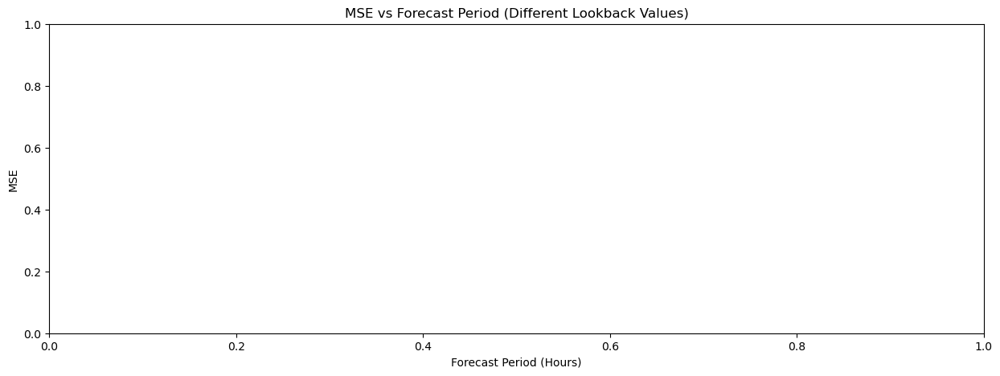

In [13]:
# Model directory path
base_path = "C:/Users/34648/OneDrive - Generalitat de Catalunya/Escriptori/waikato/"
models_path = "C:/Users/34648/OneDrive - Generalitat de Catalunya/Escriptori/waikato/univariate_models/"

# Extract all available model folders
model_folders = [folder for folder in os.listdir(models_path) if folder.startswith(f"{code}_example_transformer")]

# Dictionary to store results per lookback period
results = {}

# Iterate over each model
for model_folder in model_folders:
    full_path = os.path.join(models_path, model_folder)

    try:
        # Extract forecast period (`fh`) and lookback (`lb`) from the folder name
        parts = model_folder.split("_")
        print(parts)
        forecast_horizon = int(parts[4][:-2])  # Extract `fh` value
        lookback = int(parts[6][:-2])  # Extract `lb` value

        # Load the correct `X_test` and `Y_test` based on lookback
        start_time = time.perf_counter()
        X_test, Y_test = data_preparation.prepare_data(f'{base_path}diagnostic_data/{code}_test_example.csv', lookback, forecast_horizon, debug=True, univariate=True)
        date_list = data_preparation.extract_dates(f'{base_path}diagnostic_data/{code}_test_example.csv', lookback, forecast_horizon)
        finish_preparing = time.perf_counter()
        print(f"✅ Data prepared for Lookback={lookback}, Time Spent: {finish_preparing - start_time:.2f}s")

        # Load model
        model = tf.keras.models.load_model(full_path)
        print(f"✅ Loaded model: {model_folder}")

        # Make predictions
        predictions = model.predict(X_test, verbose=0)

        # Ensure predictions and Y_test match shape
        if Y_test.ndim == 1:
            Y_test_resized = np.tile(Y_test[:, np.newaxis], predictions.shape[1])
        else:
            Y_test_resized = Y_test

        # Compute error metrics averaged over all predicted timesteps
        mse = np.mean([mean_squared_error(Y_test_resized[:, step], predictions[:, step]) for step in range(predictions.shape[1])])
        mae = np.mean([mean_absolute_error(Y_test_resized[:, step], predictions[:, step]) for step in range(predictions.shape[1])])
        bias = np.mean([np.mean(predictions[:, step] - Y_test_resized[:, step]) for step in range(predictions.shape[1])])
        crps_val = evaluation_plot_utils.crps(Y_test_resized, predictions)
        pinball = evaluation_plot_utils.pinball_loss(Y_test_resized, predictions)

        # Store results per lookback value
        if lookback not in results:
            results[lookback] = {"Forecast Period": [], "MSE": [], "MAE": [], "Bias": [], "CRPS": [], "Pinball Loss": []}

        results[lookback]["Forecast Period"].append(forecast_horizon)
        results[lookback]["MSE"].append(mse)
        results[lookback]["MAE"].append(mae)
        results[lookback]["Bias"].append(bias)
        results[lookback]["CRPS"].append(crps_val)
        results[lookback]["Pinball Loss"].append(pinball)

    except Exception as e:
        print(f"❌ Error loading model {model_folder}: {e}")

# 📊 Plot metrics with separate color lines for each Lookback (`lb`)
metrics = ["MSE", "MAE", "Bias", "CRPS", "Pinball Loss"]
colors = ["blue", "red", "purple", "green", "orange",'salmon','magenta']
lookback_colors = {lb: colors[i % len(colors)] for i, lb in enumerate(results.keys())}

for metric in metrics:
    plt.figure(figsize=(15, 5))
    
    for lookback, data in results.items():
        sorted_indices = np.argsort(data["Forecast Period"])  # Ensure correct order
        x_sorted = np.array(data["Forecast Period"])[sorted_indices]
        y_sorted = np.array(data[metric])[sorted_indices]

        plt.plot(x_sorted, y_sorted, marker="o", linestyle="-", color=lookback_colors[lookback], label=f"Lookback={lookback}")

    plt.xlabel("Forecast Period (Hours)")
    plt.ylabel(metric)
    plt.title(f"{metric} vs Forecast Period (Different Lookback Values)")
    plt.xticks(x_sorted)  # Only show x labels where data points exist
    plt.legend()
    plt.grid(True)
    plt.show()


# NO PANDEMIC SCENARIO

In [14]:
code = "J00"
forecast = 7
lookback = 14
ff_dim = 8
learning_rate = 0.001

model_name = f'{code}_example_transformer_{forecast}fh_{ff_dim}ff_{lookback}lb_{learning_rate}initlr'

# Wave data (not needed) ............................................................................
waves = {
    "Primera Onada": ("2020-03", "2020-06"),
    "Segona Onada": ("2020-10", "2020-12"),
    "Tercera Onada": ("2021-01", "2021-03"),
    "Quarta Onada": ("2021-04", "2021-06"),
    #"Cinquena Onada": ("2021-07", "2021-09")
}

# Convertir a DataFrame per facilitar la representació
df_waves = pd.DataFrame(waves).T.reset_index()
df_waves.columns = ["Onada", "Inici", "Final"]
df_waves["Inici"] = pd.to_datetime(df_waves["Inici"])
df_waves["Final"] = pd.to_datetime(df_waves["Final"])

# CHARGE DATA .......................................................................................
start_time = time.perf_counter()
input_directory = "C:/Users/34648/OneDrive - Generalitat de Catalunya/Escriptori/waikato/"

csvFile = f'{input_directory}diagnostic_data/{code}_test_example.csv'

# prepare X and Y arrays
X_test, Y_test = data_preparation.prepare_data(f'{input_directory}diagnostic_data/{code}_test_example.csv', lookback, forecast, debug=True, univariate =True)
date_list = data_preparation.extract_dates(f'{input_directory}diagnostic_data/{code}_test_example.csv', lookback, forecast)

finish_preparing = time.perf_counter()
time_data_preparation = finish_preparing - start_time
print("finished preparing data, time spent:",time_data_preparation)
print("finished preparing timesteps, time spent:",len(date_list))


# CHARGE MODEL........................................................................................
model_name = f'{code}_example_transformer_{forecast}fh_{ff_dim}ff_{lookback}lb_{learning_rate}initlr'
print(model_name)
base_path = "C:/Users/34648/OneDrive - Generalitat de Catalunya/Escriptori/waikato/univariate_models/"

# Get available folders
available_folders = [f for f in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, f))]
print("Available model folders:", available_folders)

# Automatically select the correct one
for folder in available_folders:
    if model_name in folder:  # Check the pattern
        full_path = os.path.join(base_path, folder)
        print(f"✅ Using detected model folder: {folder}")
        break
else:
    print("❌ No matching folder found!")
    full_path = None

# Load the model if a valid path was found
if full_path:
    import tensorflow as tf
    model = tf.keras.models.load_model(full_path)
    model.summary()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840 entries, 0 to 839
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   timestamp  840 non-null    object 
 1   J00        840 non-null    float64
dtypes: float64(1), object(1)
memory usage: 13.2+ KB
Processed Data Shapes: X=(820, 14, 1), Y=(820, 7)
finished preparing data, time spent: 0.1945524000000205
finished preparing timesteps, time spent: 820
J00_example_transformer_7fh_8ff_14lb_0.001initlr
Available model folders: ['COV-19_example_transformer_14fh_8ff_14lb_0.001initlr', 'COV-19_example_transformer_14fh_8ff_182lb_0.001initlr', 'COV-19_example_transformer_14fh_8ff_1lb_0.001initlr', 'COV-19_example_transformer_14fh_8ff_30lb_0.001initlr', 'COV-19_example_transformer_14fh_8ff_365lb_0.001initlr', 'COV-19_example_transformer_14fh_8ff_60lb_0.001initlr', 'COV-19_example_transformer_14fh_8ff_7lb_0.001initlr', 'COV-19_example_transformer_182fh_8ff_14lb_0.001initlr', 'COV-19

Model: "model_96"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_97 (InputLayer)          [(None, 14, 1)]      0           []                               
                                                                                                  
 layer_normalization_384 (Layer  (None, 14, 1)       2           ['input_97[0][0]']               
 Normalization)                                                                                   
                                                                                                  
 multi_head_attention_192 (Mult  (None, 14, 1)       29          ['layer_normalization_384[0][0]',
 iHeadAttention)                                                  'layer_normalization_384[0][0]']
                                                                                           

#### Predict and evaluate

Predicted values: (820, 7)
Predicted values: (820, 7)
🔹 **Average MSE:** 0.0042
🔹 **Average MAE:** 0.0395
🔹 **Average Bias:** 0.0063
🔹 **Average CRPS:** 0.0042
🔹 **Average Pinball Loss:** 0.0198
🔹 **Average SMAPE:** 41.34%


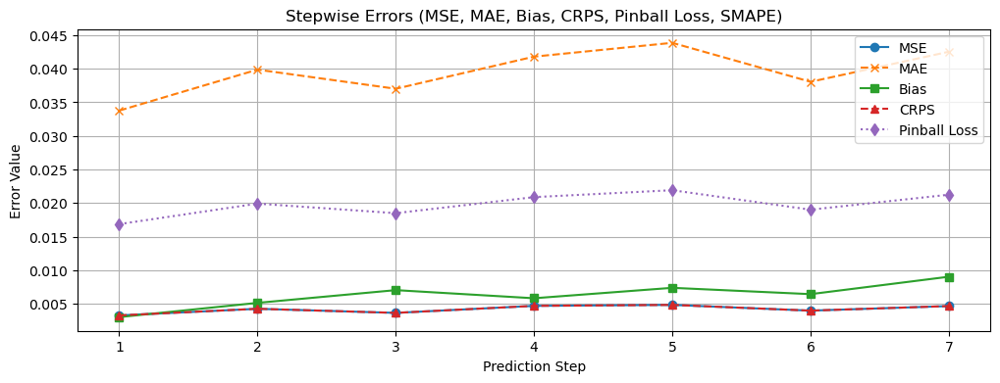

In [15]:
# Get predictions
predictions = model.predict(X_test)
print("Predicted values:", predictions.shape)
print("Predicted values:", Y_test.shape)

evaluation_plot_utils.plot_stepwise_errors(Y_test, predictions)

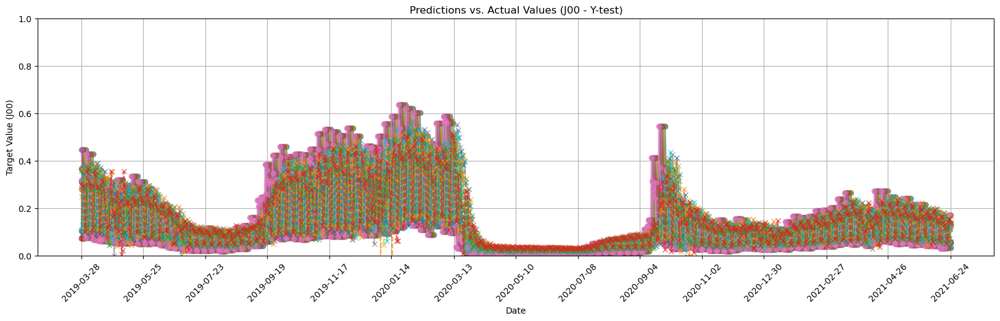

In [16]:
# Call the function with formatted dates
evaluation_plot_utils.plot_predictions_with_waves(Y_test, predictions, date_list, df_waves, waves=False)

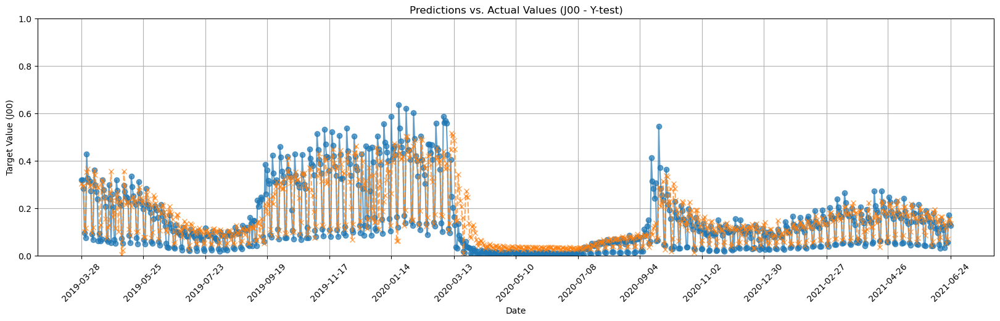

🔹 **Average MSE:** 0.0047
🔹 **Average MAE:** 0.0425
🔹 **Average Bias:** 0.0091
🔹 **Average CRPS:** 0.0047
🔹 **Average Pinball Loss:** 0.0213


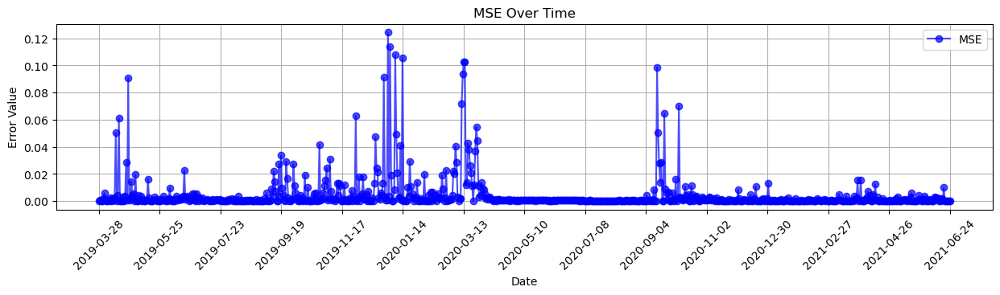

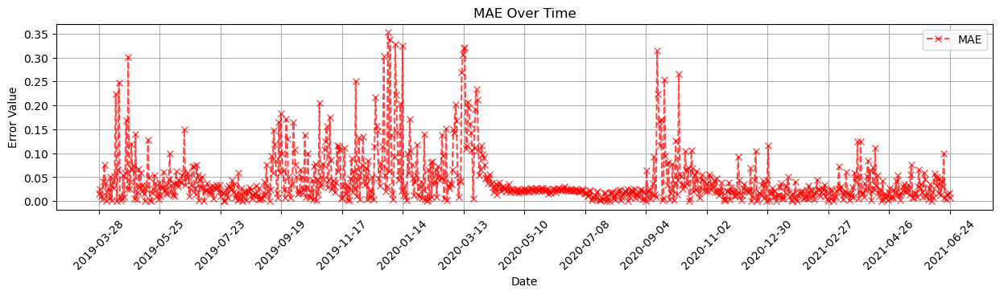

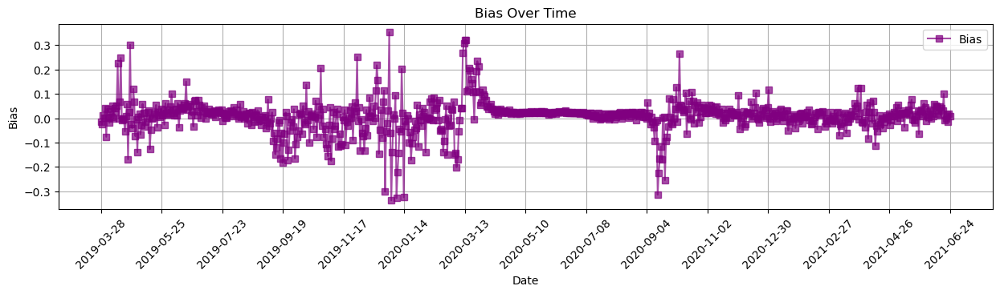

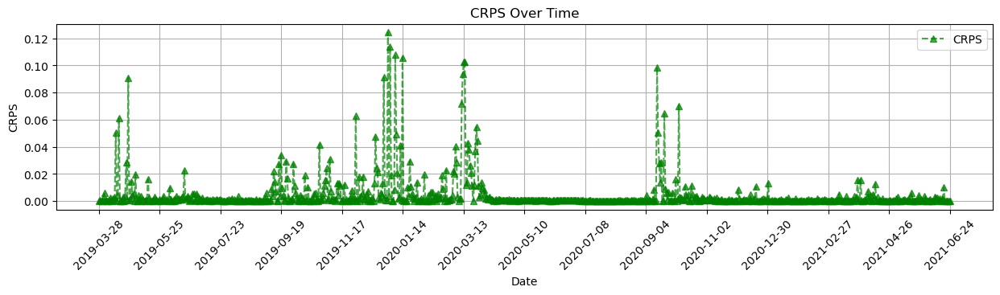

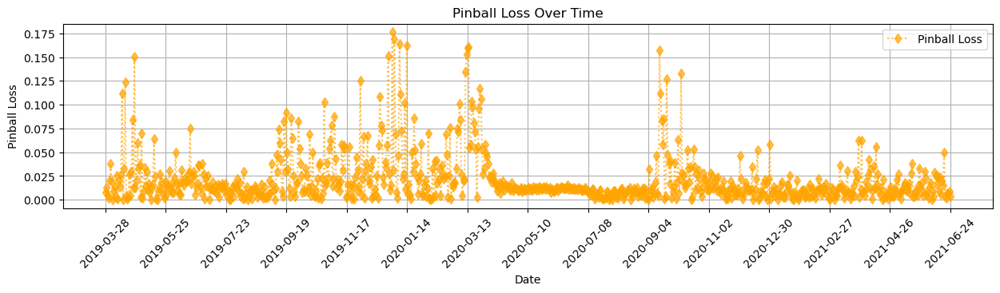

In [17]:
predictions_to_plot = predictions[:, -1] 
Y_test_to_plot = Y_test[:,-1]

# Call the function with formatted dates
evaluation_plot_utils.plot_predictions_with_waves(Y_test_to_plot, predictions_to_plot, date_list, df_waves, waves=False)

evaluation_plot_utils.plot_errors_over_time_with_waves(Y_test_to_plot, predictions_to_plot, date_list, df_waves, waves=False)

#### c. Predict the average val from the  multiple timestep forecasting

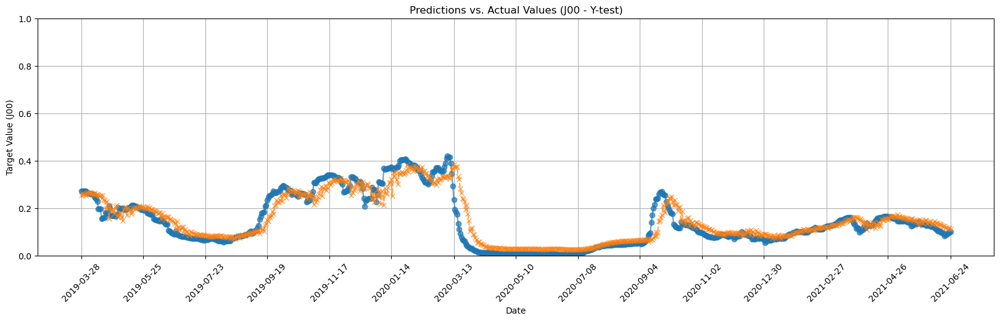

🔹 **Average MSE:** 0.0018
🔹 **Average MAE:** 0.0281
🔹 **Average Bias:** 0.0063
🔹 **Average CRPS:** 0.0018
🔹 **Average Pinball Loss:** 0.0140


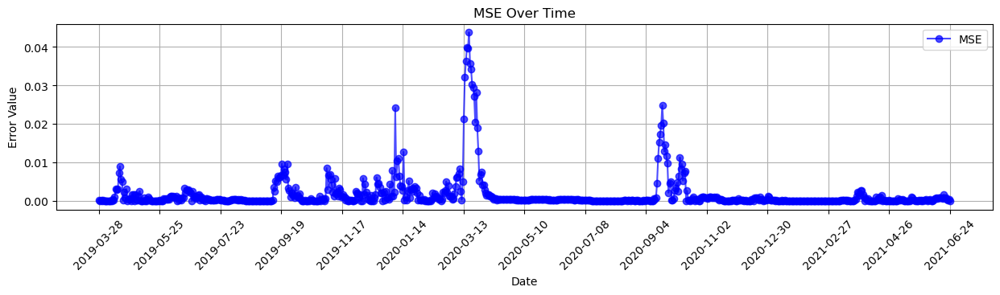

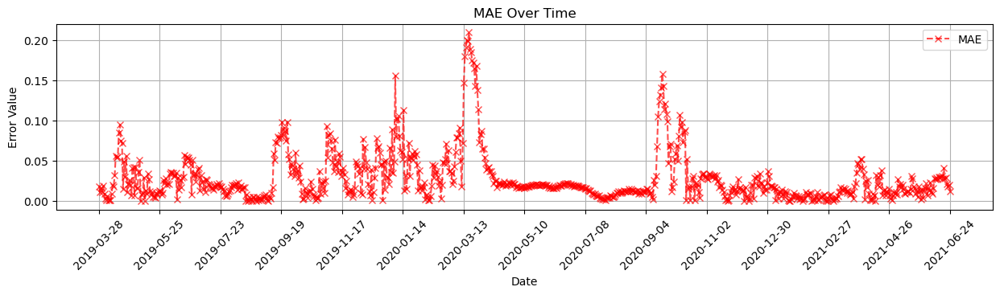

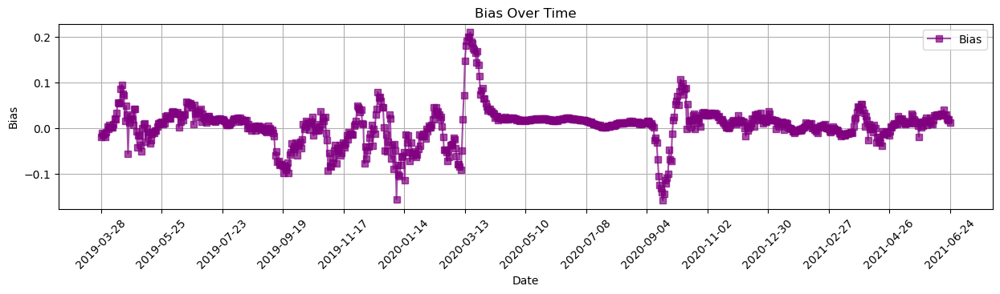

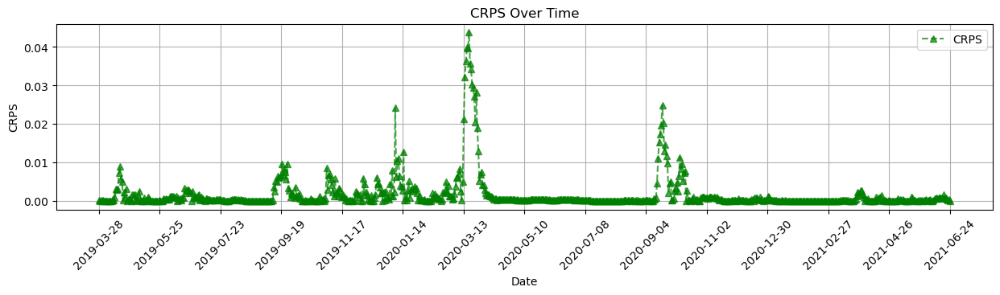

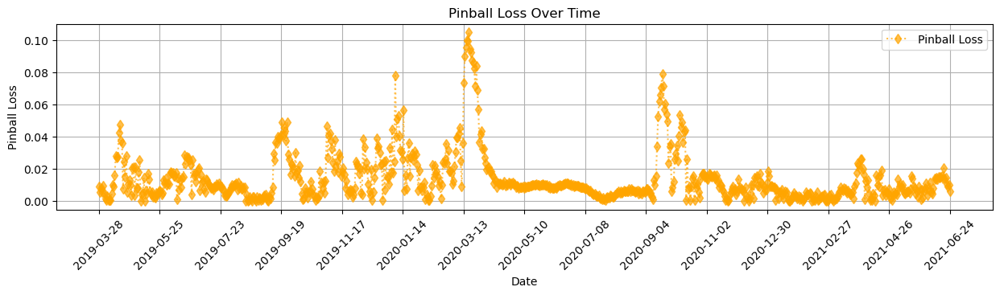

In [18]:
predictions_to_plot = predictions.mean(axis=1) 
Y_test_to_plot = Y_test.mean(axis=1)

# Call the function with formatted dates
evaluation_plot_utils.plot_predictions_with_waves(Y_test_to_plot, predictions_to_plot, date_list, df_waves,waves=False)

# Compute errors for each step and plot them
evaluation_plot_utils.plot_errors_over_time_with_waves(Y_test_to_plot, predictions_to_plot, date_list, df_waves,waves=False)

### Single Look_back period analysis

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840 entries, 0 to 839
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   timestamp  840 non-null    object 
 1   J00        840 non-null    float64
dtypes: float64(1), object(1)
memory usage: 13.2+ KB
Processed Data Shapes: X=(813, 14, 1), Y=(813, 14)
✅ Data prepared for Lookback=14, Time Spent: 0.01s
✅ Loaded model: J00_example_transformer_14fh_8ff_14lb_0.001initlr
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840 entries, 0 to 839
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   timestamp  840 non-null    object 
 1   J00        840 non-null    float64
dtypes: float64(1), object(1)
memory usage: 13.2+ KB
Processed Data Shapes: X=(645, 182, 1), Y=(645, 14)
✅ Data prepared for Lookback=182, Time Spent: 0.01s
✅ Loaded model: J00_example_transformer_14fh_8ff_182lb_0.001initlr
<class 'pandas.core.frame.D

✅ Loaded model: J00_example_transformer_1fh_8ff_30lb_0.001initlr
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840 entries, 0 to 839
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   timestamp  840 non-null    object 
 1   J00        840 non-null    float64
dtypes: float64(1), object(1)
memory usage: 13.2+ KB
Processed Data Shapes: X=(475, 365, 1), Y=(475, 1)
✅ Data prepared for Lookback=365, Time Spent: 0.01s
✅ Loaded model: J00_example_transformer_1fh_8ff_365lb_0.001initlr
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840 entries, 0 to 839
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   timestamp  840 non-null    object 
 1   J00        840 non-null    float64
dtypes: float64(1), object(1)
memory usage: 13.2+ KB
Processed Data Shapes: X=(780, 60, 1), Y=(780, 1)
✅ Data prepared for Lookback=60, Time Spent: 0.01s
✅ Loaded model: J00_example_tra

✅ Loaded model: J00_example_transformer_365fh_8ff_7lb_0.001initlr
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840 entries, 0 to 839
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   timestamp  840 non-null    object 
 1   J00        840 non-null    float64
dtypes: float64(1), object(1)
memory usage: 13.2+ KB
Processed Data Shapes: X=(767, 14, 1), Y=(767, 60)
✅ Data prepared for Lookback=14, Time Spent: 0.01s
✅ Loaded model: J00_example_transformer_60fh_8ff_14lb_0.001initlr
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840 entries, 0 to 839
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   timestamp  840 non-null    object 
 1   J00        840 non-null    float64
dtypes: float64(1), object(1)
memory usage: 13.2+ KB
Processed Data Shapes: X=(599, 182, 1), Y=(599, 60)
✅ Data prepared for Lookback=182, Time Spent: 0.01s
✅ Loaded model: J00_example_

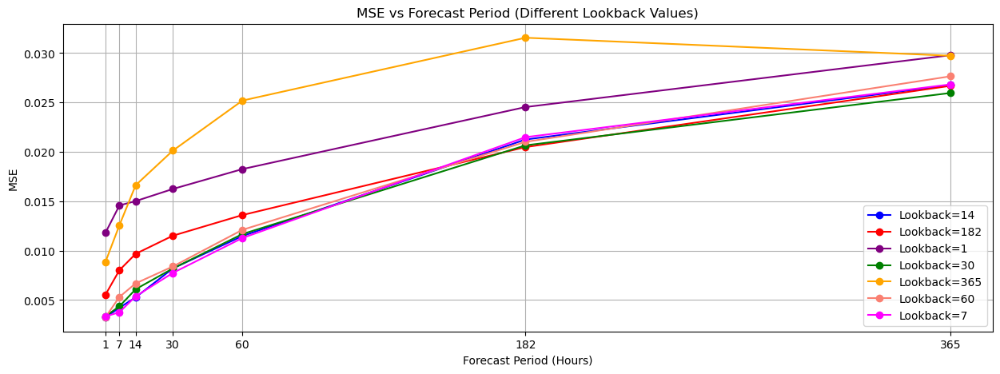

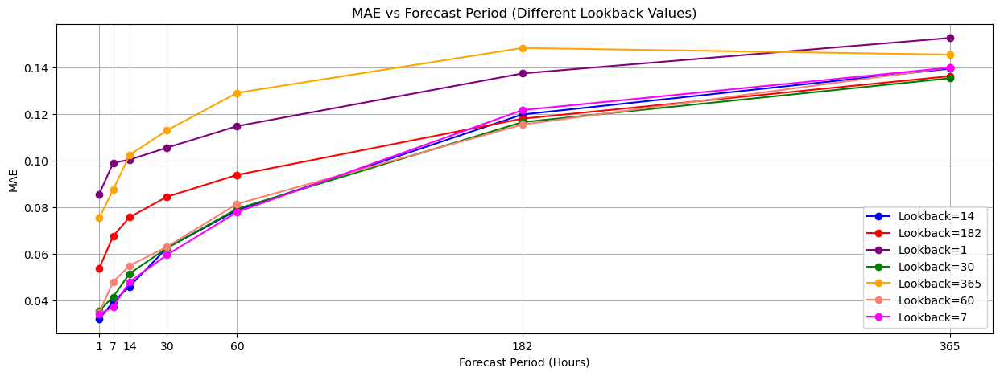

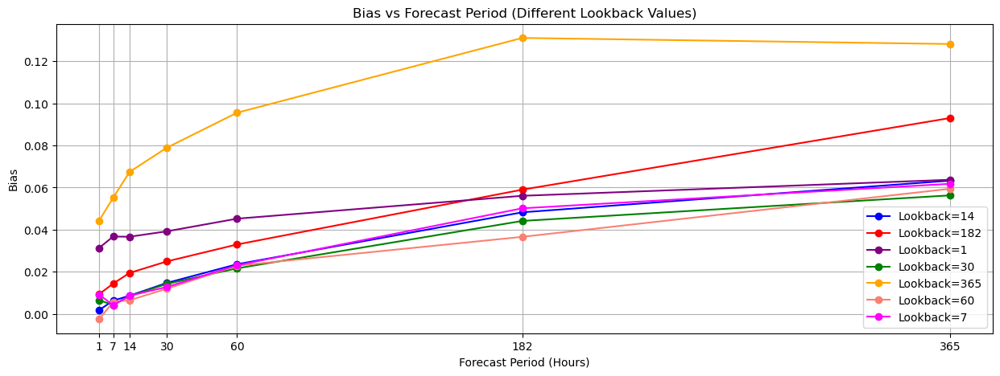

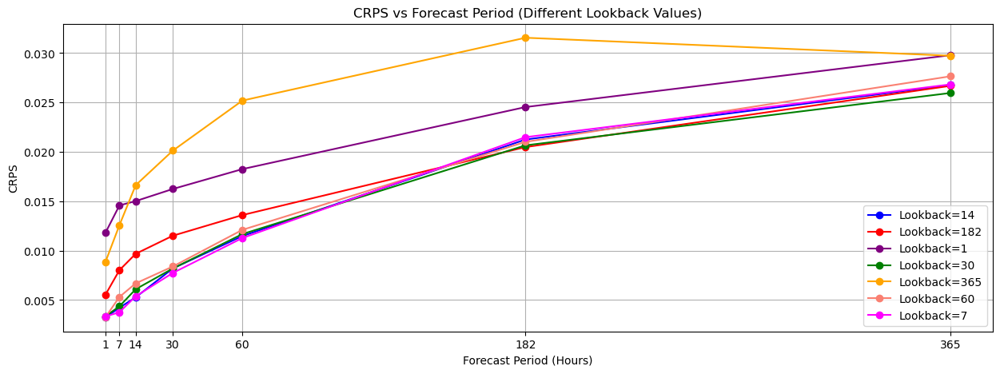

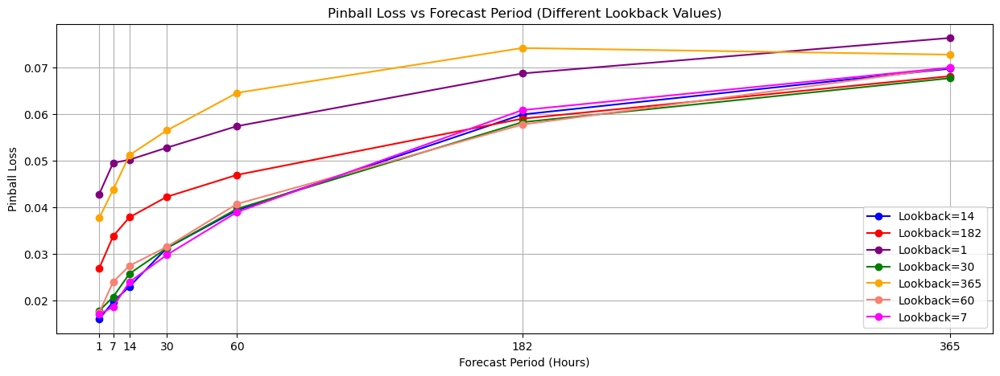

In [19]:
# Paths
base_path = "C:/Users/34648/OneDrive - Generalitat de Catalunya/Escriptori/waikato/"
models_path = os.path.join(base_path, "univariate_models")

# Extract available models
model_folders = [folder for folder in os.listdir(models_path) if folder.startswith(f"{code}_example_transformer")]

# Dictionary to store results
results = {}

for model_folder in model_folders:
    full_path = os.path.join(models_path, model_folder)

    try:
        # Extract `forecast_horizon` and `lookback`
        match = re.search(r'(\d+)fh.*?(\d+)lb', model_folder)
        if not match:
            print(f"❌ Skipping {model_folder}: Could not extract `fh` and `lb` values.")
            continue

        forecast_horizon, lookback = int(match.group(1)), int(match.group(2))

        # Prepare data
        start_time = time.perf_counter()
        X_test, Y_test = data_preparation.prepare_data(f'{base_path}diagnostic_data/{code}_test_example.csv', lookback, forecast_horizon, debug=True, univariate=True)
        date_list = data_preparation.extract_dates(f'{base_path}diagnostic_data/{code}_test_example.csv', lookback, forecast_horizon)
        finish_preparing = time.perf_counter()
        print(f"✅ Data prepared for Lookback={lookback}, Time Spent: {finish_preparing - start_time:.2f}s")

        # Load model
        model = tf.keras.models.load_model(full_path)
        print(f"✅ Loaded model: {model_folder}")

        # Make predictions
        predictions = model.predict(X_test, verbose=0)
        if predictions is None or predictions.shape[0] == 0:
            print(f"❌ Skipping model {model_folder}: No valid predictions generated.")
            continue

        # Ensure predictions and Y_test match shape
        Y_test_resized = np.tile(Y_test[:, np.newaxis], predictions.shape[1]) if Y_test.ndim == 1 else Y_test

        # Compute error metrics
        mse = np.mean([mean_squared_error(Y_test_resized[:, step], predictions[:, step]) for step in range(predictions.shape[1])])
        mae = np.mean([mean_absolute_error(Y_test_resized[:, step], predictions[:, step]) for step in range(predictions.shape[1])])
        bias = np.mean([np.mean(predictions[:, step] - Y_test_resized[:, step]) for step in range(predictions.shape[1])])
        crps_val = evaluation_plot_utils.crps(Y_test_resized, predictions)
        pinball = evaluation_plot_utils.pinball_loss(Y_test_resized, predictions)

        # Store results
        if lookback not in results:
            results[lookback] = {"Forecast Period": [], "MSE": [], "MAE": [], "Bias": [], "CRPS": [], "Pinball Loss": []}

        results[lookback]["Forecast Period"].append(forecast_horizon)
        results[lookback]["MSE"].append(mse)
        results[lookback]["MAE"].append(mae)
        results[lookback]["Bias"].append(bias)
        results[lookback]["CRPS"].append(crps_val)
        results[lookback]["Pinball Loss"].append(pinball)

    except OSError as os_error:
        print(f"❌ OS error loading model {model_folder}: {os_error}")
    except ValueError as value_error:
        print(f"❌ Value error in {model_folder}: {value_error}")
    except Exception as e:
        print(f"❌ Unknown error loading {model_folder}: {e}")

# 📊 Plot metrics
metrics = ["MSE", "MAE", "Bias", "CRPS", "Pinball Loss"]
colors = ["blue", "red", "purple", "green", "orange", "salmon", "magenta"]
lookback_colors = {lb: colors[i % len(colors)] for i, lb in enumerate(results.keys())}

for metric in metrics:
    plt.figure(figsize=(15, 5))

    for lookback, data in results.items():
        sorted_indices = np.argsort(data["Forecast Period"])  # Sort x-axis
        x_sorted = np.array(data["Forecast Period"])[sorted_indices]
        y_sorted = np.array(data[metric])[sorted_indices]

        plt.plot(x_sorted, y_sorted, marker="o", linestyle="-", color=lookback_colors[lookback], label=f"Lookback={lookback}")

    plt.xlabel("Forecast Period (Hours)")
    plt.ylabel(metric)
    plt.title(f"{metric} vs Forecast Period (Different Lookback Values)")
    plt.xticks(x_sorted)
    plt.legend()

    if not any("Lookback" in lbl for lbl in plt.gca().get_legend_handles_labels()[1]):
        print("⚠️ Warning: No valid labels found for legend.")

    plt.grid(True)
    plt.show()

# UNIVARIATE + DIAGS + SEASON

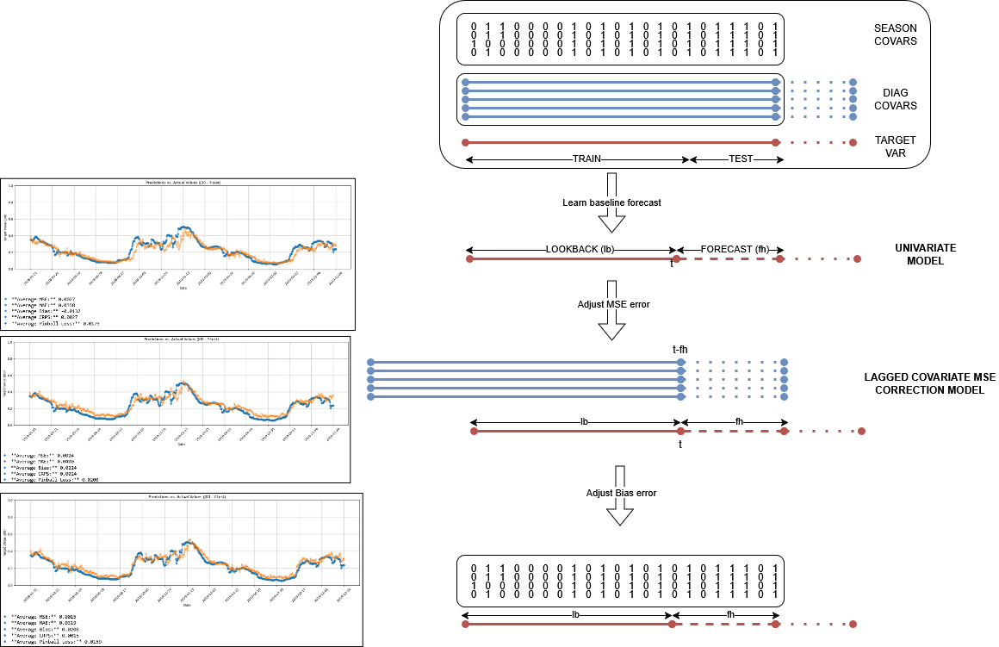

In [19]:
display(Image("WAIKATO.drawio.png"))

In [20]:
code = "J00"
forecast = 7
lookback = 30
ff_dim = 8
learning_rate = 0.001
input_directory = "C:/Users/34648/OneDrive - Generalitat de Catalunya/Escriptori/waikato/"

# covariates and dataframe .....................................................................................
covs = ['B34','L22','J21','R09','H73','R56','T69','J15','J11','J96','R50','N42']
#lagged_covs = {'B34':14,'L22':21,'J21':15,'R09':15,'H73':14,'R56':14,
 #              'T69':14,'J15':15,'J11':28,'J96':15,'R50':15,'N42':28}  # Use past 3 HR values, past 2 BP values

#covs = ['Y04',"R33","L90","H15","K12","N17","P38","Q67"]
#covs= ['A60','S43','K59','G50','S82','N12','I63','R31','I26','K29','Z33','K20']    
    
start_time = time.perf_counter()

# train and test partition files
csvFile_tst = f'{input_directory}diagnostic_data/{code}_test_example.csv'
csvFile_tr = f'{input_directory}diagnostic_data/{code}_train_example.csv'

# prepare X and Y arrays
X_test, Y_test = data_preparation.prepare_data(f'{input_directory}diagnostic_data/{code}_test_example.csv', lookback, forecast, debug=True, univariate =True)
date_list_test = data_preparation.extract_dates(f'{input_directory}diagnostic_data/{code}_test_example.csv', lookback, forecast)

X_train, Y_train = data_preparation.prepare_data(f'{input_directory}diagnostic_data/{code}_train_example.csv', lookback, forecast, debug=True, univariate =True)
date_list_train = data_preparation.extract_dates(f'{input_directory}diagnostic_data/{code}_train_example.csv', lookback, forecast)

finish_preparing = time.perf_counter()
time_data_preparation = finish_preparing - start_time
print("finished preparing data, time spent:",time_data_preparation)
print("finished preparing timesteps test, time spent:",len(date_list_test))
print("finished preparing timesteps train, time spent:",len(date_list_train))


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840 entries, 0 to 839
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   timestamp  840 non-null    object 
 1   J00        840 non-null    float64
dtypes: float64(1), object(1)
memory usage: 13.2+ KB
Processed Data Shapes: X=(804, 30, 1), Y=(804, 7)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3359 entries, 0 to 3358
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   timestamp  3359 non-null   object 
 1   J00        3359 non-null   float64
dtypes: float64(1), object(1)
memory usage: 52.6+ KB
Processed Data Shapes: X=(3323, 30, 1), Y=(3323, 7)
finished preparing data, time spent: 0.03697310000001153
finished preparing timesteps test, time spent: 804
finished preparing timesteps train, time spent: 3323


In [21]:
# directory definitions ........................................................................................
univariate_base_path = "C:/Users/34648/OneDrive - Generalitat de Catalunya/Escriptori/waikato/univariate_models/"
seasonal_base_path = "C:/Users/34648/OneDrive - Generalitat de Catalunya/Escriptori/waikato/seasonal_models/"
diagnostics_base_path = "C:/Users/34648/OneDrive - Generalitat de Catalunya/Escriptori/waikato/diagnostics_models/"

univariate_model_name = f'{code}_example_transformer_{forecast}fh_{ff_dim}ff_{lookback}lb_{learning_rate}initlr'
diagnostics_covs_residual_models = f'{code}_DIAGNOSTICS_RESIDUALS_LEARNING_{forecast}fh_{ff_dim}ff_{lookback}lb_{learning_rate}initlr'
seasonal_covs_residual_models = f'{code}_SEASONAL_RESIDUALS_LEARNING_{forecast}fh_{ff_dim}ff_{lookback}lb_{learning_rate}initlr'

print("Univariate model folder:                           ",univariate_model_name)
print("Diagnostics covariates lagged residuals models:    ",diagnostics_covs_residual_models)
print("Seasonal covariates residuals models:              ",seasonal_covs_residual_models)

Univariate model folder:                            J00_example_transformer_7fh_8ff_30lb_0.001initlr
Diagnostics covariates lagged residuals models:     J00_DIAGNOSTICS_RESIDUALS_LEARNING_7fh_8ff_30lb_0.001initlr
Seasonal covariates residuals models:               J00_SEASONAL_RESIDUALS_LEARNING_7fh_8ff_30lb_0.001initlr


In [22]:
# diagnostic data ...............................................................................................
df = pd.read_csv('C:/Users/34648/OneDrive - Generalitat de Catalunya/Escriptori/waikato/input data/longitudinalitat_DIAGNOSTICS_GROUPED.csv', index_col=0)
scaler = MinMaxScaler(feature_range=(0, 1)) # Apply Min-Max Scaling (0 to 1)
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns, index=df.index)
df_covs = df[covs]
df_covs = df_covs.assign(timestamp=df_covs.index)
#Ensure index is in datetime format (or set it correctly)
if 'timestamp' in df_covs.columns:
    df_covs['timestamp'] = pd.to_datetime(df_covs['timestamp'])
    df_covs.set_index('timestamp', inplace=True)

# Ensure index is in datetime format
df_covs.index = pd.to_datetime(df_covs.index)

# Create a complete date range from min to max date in the index
full_date_range = pd.date_range(start=df_covs.index.min(), end=df_covs.index.max(), freq='D')

# Reindex the DataFrame to include all dates, filling missing ones with 0
df_filled = df_covs.reindex(full_date_range, fill_value=0)
df_filled['timestamp'] = df_filled.index

In [23]:
code = "J00"
forecast = 7
lookback = 30
ff_dim = 8
learning_rate = 0.001
input_directory = "C:/Users/34648/OneDrive - Generalitat de Catalunya/Escriptori/waikato/"

# 📂 Directory Definitions
base_path = "C:/Users/34648/OneDrive - Generalitat de Catalunya/Escriptori/waikato/"
univariate_base_path = os.path.join(base_path, "univariate_models/")
seasonal_base_path = os.path.join(base_path, "seasonal_models/")
diagnostics_base_path = os.path.join(base_path, "diagnostics_models/")

# 🔍 Extract all available model folders
try:
    model_folders = [
        entry.name for entry in os.scandir(seasonal_base_path) 
        if entry.is_dir() and entry.name.startswith(f"{code}_SEASONAL_RESIDUALS_LEARNING")
    ]
    print("Detected model folders:", model_folders)
except Exception as e:
    raise ValueError(f"Error reading model folders: {e}")

# 📊 Dictionary to store results
results_univariate = {}
results_diags = {}
results_season = {}

# 🏃‍♂️ Iterate over each model folder
for model_folder in model_folders:
    full_path = os.path.join(seasonal_base_path, model_folder)

    # 🏷️ Extract forecast (`fh`) and lookback (`lb`) from the model name
    try:
        parts = model_folder.split("_")
        print(parts)
        forecast = int(parts[4].replace("fh", ""))  # Extract `fh`
        lookback = int(parts[6].replace("lb", ""))  # Extract `lb`
    except (IndexError, ValueError) as e:
        print(f"⚠️ Skipping {model_folder} due to unexpected name format: {e}")
        continue
        
    print(f"Processing model: {model_folder} | Forecast={forecast} | Lookback={lookback}")
   
    # 📂 Load Test Data
    csvFile_tst = f'{input_directory}diagnostic_data/{code}_test_example.csv'
    df_tst = pd.read_csv(csvFile_tst)

    # 🛠️ Prepare X and Y arrays
    X_test, Y_test = data_preparation.prepare_data(f'{input_directory}diagnostic_data/{code}_test_example.csv', 
                                                       lookback, forecast, debug=True, univariate =True)
    date_list_test = data_preparation.extract_dates(f'{input_directory}diagnostic_data/{code}_test_example.csv', 
                                                        lookback, forecast)

    finish_preparing = time.perf_counter()
    time_data_preparation = finish_preparing - start_time
    print("finished preparing data, time spent:",time_data_preparation)
    print("finished preparing timesteps test, time spent:",len(date_list_test))
        
    # DIAG COVS shifted .......................................................................................
    df_covs = data_preparation.shift_covariates(df_filled, forecast)              # shift all columns
    df_covs_subset_tst = data_preparation.subset_df_covs_by_index(df_tst, df_covs)
    df_covs_subset_tst.drop(columns=["timestamp"], inplace=True)                   # drop the shifted date
    df_covs_subset_tst["timestamp"] = df_covs_subset_tst.index                     # add new date (false one)
    df_covs_subset_tst = df_covs_subset_tst[['timestamp'] + 
                                                [col for col in df_covs_subset_tst.columns if col != 'timestamp']]


    # SEASON COVS .............................................................................................
    categorical_vars = ["Day_of_Week", "Month", "Season", "Holiday", "School_Vacation"]
    df_processed_tst = data_preparation.prepare_time_series_features(df_tst, categorical_vars)
    
    print("✅ Data prepared | X_test shape:", X_test.shape, "| Y_test shape:", Y_test.shape)
    

    # ⏳ Timing the process
    start_time = time.perf_counter()

    # 🏥 Load Univariate Model
    try:
        model_univariate = f"{code}_example_transformer_{forecast}fh_{ff_dim}ff_{lookback}lb_{learning_rate}initlr"
        modelUNI = tf.keras.models.load_model(os.path.join(base_path,univariate_base_path, model_univariate))
        predictions_test = modelUNI.predict(X_test)
        print("📈 Predictions shape:", predictions_test.shape)
    except Exception as e:
        print(f"❌ Error loading UNIVARIATE model {model_folder}: {e}")
        continue

    # 🛠️ Resize Y_test if needed
    Y_test_resized = np.tile(Y_test[:, np.newaxis], predictions_test.shape[1]) if Y_test.ndim == 1 else Y_test

    # 📉 Compute error metrics
    mse = np.mean([mean_squared_error(Y_test_resized[:, step], predictions_test[:, step]) for step in range(predictions_test.shape[1])])
    mae = np.mean([mean_absolute_error(Y_test_resized[:, step], predictions_test[:, step]) for step in range(predictions_test.shape[1])])
    bias = np.mean([np.mean(predictions_test[:, step] - Y_test_resized[:, step]) for step in range(predictions_test.shape[1])])
    crps_val = evaluation_plot_utils.crps(Y_test_resized, predictions_test)
    pinball = evaluation_plot_utils.pinball_loss(Y_test_resized, predictions_test)

    # 📝 Store Univariate Results
    if lookback not in results_univariate:
        results_univariate[lookback] = {"Forecast Period": [], "MSE": [], "MAE": [], "Bias": [], "CRPS": [], "Pinball Loss": []}

    results_univariate[lookback]["Forecast Period"].append(forecast)
    results_univariate[lookback]["MSE"].append(mse)
    results_univariate[lookback]["MAE"].append(mae)
    results_univariate[lookback]["Bias"].append(bias)
    results_univariate[lookback]["CRPS"].append(crps_val)
    results_univariate[lookback]["Pinball Loss"].append(pinball)
    

    print(f"📊 Univariate results stored for Lookback={lookback} , Forecast={forecast}")

    
    # 🏥 Load DIAGNOSTICS Model (Residual Learning) -----------------------------------------------------------------
    try:
        diagnostics_covs_residual_models = f"{code}_DIAGNOSTICS_RESIDUALS_LEARNING_{forecast}fh_{ff_dim}ff_{lookback}lb_{learning_rate}initlr"
        modelDIAG = tf.keras.models.load_model(os.path.join(base_path,diagnostics_base_path, diagnostics_covs_residual_models))
        
        X_test_covs = data_preparation.generate_rolling_sequences_covariates(df_covs_subset_tst, lookback, forecast, predictions_test)
        predicted_test_residuals_DIAGS = modelDIAG.predict(X_test_covs)

        corrected_test_forecast_DIAG = predictions_test + np.squeeze(predicted_test_residuals_DIAGS, axis=-1)
        
        print(f"✅ Diagnostics model applied for Lookback={lookback} , Forecast={forecast}")

        # 📉 Compute corrected error metrics
        mse_diag = np.mean([mean_squared_error(Y_test_resized[:, step], corrected_test_forecast_DIAG[:, step]) for step in range(corrected_test_forecast_DIAG.shape[1])])
        mae_diag = np.mean([mean_absolute_error(Y_test_resized[:, step], corrected_test_forecast_DIAG[:, step]) for step in range(corrected_test_forecast_DIAG.shape[1])])
        bias_diag = np.mean([np.mean(corrected_test_forecast_DIAG[:, step] - Y_test_resized[:, step]) for step in range(corrected_test_forecast_DIAG.shape[1])])
        crps_diag = evaluation_plot_utils.crps(Y_test_resized, corrected_test_forecast_DIAG)
        pinball_diag = evaluation_plot_utils.pinball_loss(Y_test_resized, corrected_test_forecast_DIAG)

        # Store Diagnostics Results
        if lookback not in results_diags:
            results_diags[lookback] = {"Forecast Period": [], "MSE": [], "MAE": [], "Bias": [], "CRPS": [], "Pinball Loss": []}

        results_diags[lookback]["Forecast Period"].append(forecast)
        results_diags[lookback]["MSE"].append(mse_diag)
        results_diags[lookback]["MAE"].append(mae_diag)
        results_diags[lookback]["Bias"].append(bias_diag)
        results_diags[lookback]["CRPS"].append(crps_diag)
        results_diags[lookback]["Pinball Loss"].append(pinball_diag)
        
        print(f"📊 Diagnostic results stored for Lookback={lookback} , Forecast={forecast}")

    except Exception as e:
        print(f"❌ Error loading DIAGNOSTICS model {diagnostics_covs_residual_models}: {e}")
        

        
    # 🌍 Load SEASONAL Model -------------------------------------------------------------------------------------
    try:
        seasonal_covs_residual_models = f"{code}_SEASONAL_RESIDUALS_LEARNING_{forecast}fh_{ff_dim}ff_{lookback}lb_{learning_rate}initlr"
        modelSEAS = tf.keras.models.load_model(os.path.join(base_path,seasonal_base_path, seasonal_covs_residual_models))
        X_test_covs = data_preparation.generate_rolling_sequences_covariates(df_processed_tst, lookback, forecast, corrected_test_forecast_DIAG)
        predicted_test_bias_SEASONAL = modelSEAS.predict(X_test_covs)

        corrected_test_forecast_BIAS = corrected_test_forecast_DIAG - np.squeeze(predicted_test_bias_SEASONAL, axis=-1)

        print(f"✅ Seasonal model applied for Lookback={lookback}")
        
        # 📉 Compute corrected error metrics
        mse_ses = np.mean([mean_squared_error(Y_test_resized[:, step], corrected_test_forecast_BIAS[:, step]) for step in range(corrected_test_forecast_BIAS.shape[1])])
        mae_ses = np.mean([mean_absolute_error(Y_test_resized[:, step], corrected_test_forecast_BIAS[:, step]) for step in range(corrected_test_forecast_BIAS.shape[1])])
        bias_ses = np.mean([np.mean(corrected_test_forecast_BIAS[:, step] - Y_test_resized[:, step]) for step in range(corrected_test_forecast_BIAS.shape[1])])
        crps_ses = evaluation_plot_utils.crps(Y_test_resized, corrected_test_forecast_BIAS)
        pinball_ses = evaluation_plot_utils.pinball_loss(Y_test_resized, corrected_test_forecast_BIAS)
    
        # 📝 Store Seasonal Results
        if lookback not in results_season:
            results_season[lookback] = {"Forecast Period": [], "MSE": [], "MAE": [], "Bias": [], 
                                        "CRPS": [], "Pinball Loss": []}

        results_season[lookback]["Forecast Period"].append(forecast)
        results_season[lookback]["MSE"].append(mse_ses)
        results_season[lookback]["MAE"].append(mae_ses)
        results_season[lookback]["Bias"].append(bias_ses)
        results_season[lookback]["CRPS"].append(crps_ses)
        results_season[lookback]["Pinball Loss"].append(pinball_ses)

        print(f"📊 Seasonal results stored for Lookback={lookback} , Forecast={forecast}")
        
        
        print(f"UNIVATIATE MSE error:{mse}")
        print(f"UNIVATIATE+DIAGS MSE error:{mse_diag}")
        print(f"UNIVATIATE+DIAG+SEASONAL MSE error:{mse_ses}")
    
    except Exception as e:
        print(f"❌ Error loading SEASONAL model {seasonal_covs_residual_models}: {e}")
        
        corrected_test_forecast_BIAS = corrected_test_forecast_DIAG  # Use previous corrected forecast if seasonal model fails



    # ✅ Finished processing this model
    print(f"✅ Finished processing {model_folder}\n")
    print(f"\n----------------------------------------------------------------------\n")

print("🚀 Processing complete.")

Detected model folders: ['J00_SEASONAL_RESIDUALS_LEARNING_14fh_8ff_14lb_0.001initlr', 'J00_SEASONAL_RESIDUALS_LEARNING_14fh_8ff_1lb_0.001initlr', 'J00_SEASONAL_RESIDUALS_LEARNING_14fh_8ff_30lb_0.001initlr', 'J00_SEASONAL_RESIDUALS_LEARNING_14fh_8ff_365lb_0.001initlr', 'J00_SEASONAL_RESIDUALS_LEARNING_14fh_8ff_60lb_0.001initlr', 'J00_SEASONAL_RESIDUALS_LEARNING_14fh_8ff_7lb_0.001initlr', 'J00_SEASONAL_RESIDUALS_LEARNING_182fh_8ff_14lb_0.001initlr', 'J00_SEASONAL_RESIDUALS_LEARNING_182fh_8ff_182lb_0.001initlr', 'J00_SEASONAL_RESIDUALS_LEARNING_182fh_8ff_1lb_0.001initlr', 'J00_SEASONAL_RESIDUALS_LEARNING_182fh_8ff_30lb_0.001initlr', 'J00_SEASONAL_RESIDUALS_LEARNING_182fh_8ff_365lb_0.001initlr', 'J00_SEASONAL_RESIDUALS_LEARNING_182fh_8ff_60lb_0.001initlr', 'J00_SEASONAL_RESIDUALS_LEARNING_182fh_8ff_7lb_0.001initlr', 'J00_SEASONAL_RESIDUALS_LEARNING_1fh_8ff_14lb_0.001initlr', 'J00_SEASONAL_RESIDUALS_LEARNING_1fh_8ff_1lb_0.001initlr', 'J00_SEASONAL_RESIDUALS_LEARNING_1fh_8ff_30lb_0.001initlr

✅ Diagnostics model applied for Lookback=365 , Forecast=14
📊 Diagnostic results stored for Lookback=365 , Forecast=14
Processed covariate data Shapes: X=(462, 14, 27)
Processed covariate Shapes + predictions: X=(462, 14, 28)
✅ Seasonal model applied for Lookback=365
📊 Seasonal results stored for Lookback=365 , Forecast=14
UNIVATIATE MSE error:0.016628141535567263
UNIVATIATE+DIAGS MSE error:0.006623353785429711
UNIVATIATE+DIAG+SEASONAL MSE error:0.007585892781792307
✅ Finished processing J00_SEASONAL_RESIDUALS_LEARNING_14fh_8ff_365lb_0.001initlr


----------------------------------------------------------------------

['J00', 'SEASONAL', 'RESIDUALS', 'LEARNING', '14fh', '8ff', '60lb', '0.001initlr']
Processing model: J00_SEASONAL_RESIDUALS_LEARNING_14fh_8ff_60lb_0.001initlr | Forecast=14 | Lookback=60
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840 entries, 0 to 839
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0  

📈 Predictions shape: (629, 182)
📊 Univariate results stored for Lookback=30 , Forecast=182
Processed covariate data Shapes: X=(629, 182, 12)
Processed covariate Shapes + predictions: X=(629, 182, 13)
✅ Diagnostics model applied for Lookback=30 , Forecast=182
📊 Diagnostic results stored for Lookback=30 , Forecast=182
Processed covariate data Shapes: X=(629, 182, 27)
Processed covariate Shapes + predictions: X=(629, 182, 28)
✅ Seasonal model applied for Lookback=30
📊 Seasonal results stored for Lookback=30 , Forecast=182
UNIVATIATE MSE error:0.020663229662246558
UNIVATIATE+DIAGS MSE error:0.01691246686778021
UNIVATIATE+DIAG+SEASONAL MSE error:0.01507127079945941
✅ Finished processing J00_SEASONAL_RESIDUALS_LEARNING_182fh_8ff_30lb_0.001initlr


----------------------------------------------------------------------

['J00', 'SEASONAL', 'RESIDUALS', 'LEARNING', '182fh', '8ff', '365lb', '0.001initlr']
Processing model: J00_SEASONAL_RESIDUALS_LEARNING_182fh_8ff_365lb_0.001initlr | Forecast=18

✅ Seasonal model applied for Lookback=1
📊 Seasonal results stored for Lookback=1 , Forecast=1
UNIVATIATE MSE error:0.011819150267175916
UNIVATIATE+DIAGS MSE error:0.00980815506948533
UNIVATIATE+DIAG+SEASONAL MSE error:0.007205660849681196
✅ Finished processing J00_SEASONAL_RESIDUALS_LEARNING_1fh_8ff_1lb_0.001initlr


----------------------------------------------------------------------

['J00', 'SEASONAL', 'RESIDUALS', 'LEARNING', '1fh', '8ff', '30lb', '0.001initlr']
Processing model: J00_SEASONAL_RESIDUALS_LEARNING_1fh_8ff_30lb_0.001initlr | Forecast=1 | Lookback=30
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840 entries, 0 to 839
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   timestamp  840 non-null    object 
 1   J00        840 non-null    float64
dtypes: float64(1), object(1)
memory usage: 13.2+ KB
Processed Data Shapes: X=(810, 30, 1), Y=(810, 1)
finished preparing data, time spent: 10.815620199999898
fi

📈 Predictions shape: (629, 30)
📊 Univariate results stored for Lookback=182 , Forecast=30
Processed covariate data Shapes: X=(629, 30, 12)
Processed covariate Shapes + predictions: X=(629, 30, 13)
✅ Diagnostics model applied for Lookback=182 , Forecast=30
📊 Diagnostic results stored for Lookback=182 , Forecast=30
Processed covariate data Shapes: X=(629, 30, 27)
Processed covariate Shapes + predictions: X=(629, 30, 28)
✅ Seasonal model applied for Lookback=182
📊 Seasonal results stored for Lookback=182 , Forecast=30
UNIVATIATE MSE error:0.011509158711037814
UNIVATIATE+DIAGS MSE error:0.008237675058903932
UNIVATIATE+DIAG+SEASONAL MSE error:0.007070301788988045
✅ Finished processing J00_SEASONAL_RESIDUALS_LEARNING_30fh_8ff_182lb_0.001initlr


----------------------------------------------------------------------

['J00', 'SEASONAL', 'RESIDUALS', 'LEARNING', '30fh', '8ff', '1lb', '0.001initlr']
Processing model: J00_SEASONAL_RESIDUALS_LEARNING_30fh_8ff_1lb_0.001initlr | Forecast=30 | Lookb

📈 Predictions shape: (294, 365)
📊 Univariate results stored for Lookback=182 , Forecast=365
Processed covariate data Shapes: X=(294, 365, 12)
Processed covariate Shapes + predictions: X=(294, 365, 13)
✅ Diagnostics model applied for Lookback=182 , Forecast=365
📊 Diagnostic results stored for Lookback=182 , Forecast=365
Processed covariate data Shapes: X=(294, 365, 27)
Processed covariate Shapes + predictions: X=(294, 365, 28)
✅ Seasonal model applied for Lookback=182
📊 Seasonal results stored for Lookback=182 , Forecast=365
UNIVATIATE MSE error:0.026687338922354163
UNIVATIATE+DIAGS MSE error:0.0357590253744872
UNIVATIATE+DIAG+SEASONAL MSE error:0.02720017786733622
✅ Finished processing J00_SEASONAL_RESIDUALS_LEARNING_365fh_8ff_182lb_0.001initlr


----------------------------------------------------------------------

['J00', 'SEASONAL', 'RESIDUALS', 'LEARNING', '365fh', '8ff', '1lb', '0.001initlr']
Processing model: J00_SEASONAL_RESIDUALS_LEARNING_365fh_8ff_1lb_0.001initlr | Forecast=3

✅ Seasonal model applied for Lookback=7
📊 Seasonal results stored for Lookback=7 , Forecast=365
UNIVATIATE MSE error:0.026831391442865983
UNIVATIATE+DIAGS MSE error:0.021593015631263708
UNIVATIATE+DIAG+SEASONAL MSE error:0.022396498859284786
✅ Finished processing J00_SEASONAL_RESIDUALS_LEARNING_365fh_8ff_7lb_0.001initlr


----------------------------------------------------------------------

['J00', 'SEASONAL', 'RESIDUALS', 'LEARNING', '60fh', '8ff', '14lb', '0.001initlr']
Processing model: J00_SEASONAL_RESIDUALS_LEARNING_60fh_8ff_14lb_0.001initlr | Forecast=60 | Lookback=14
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840 entries, 0 to 839
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   timestamp  840 non-null    object 
 1   J00        840 non-null    float64
dtypes: float64(1), object(1)
memory usage: 13.2+ KB
Processed Data Shapes: X=(767, 14, 1), Y=(767, 60)
finished preparing data, time spent: 16.990297400

📈 Predictions shape: (774, 60)
📊 Univariate results stored for Lookback=7 , Forecast=60
Processed covariate data Shapes: X=(774, 60, 12)
Processed covariate Shapes + predictions: X=(774, 60, 13)
✅ Diagnostics model applied for Lookback=7 , Forecast=60
📊 Diagnostic results stored for Lookback=7 , Forecast=60
Processed covariate data Shapes: X=(774, 60, 27)
Processed covariate Shapes + predictions: X=(774, 60, 28)
✅ Seasonal model applied for Lookback=7
📊 Seasonal results stored for Lookback=7 , Forecast=60
UNIVATIATE MSE error:0.011278276510048726
UNIVATIATE+DIAGS MSE error:0.021368606666102404
UNIVATIATE+DIAG+SEASONAL MSE error:0.017006282896037797
✅ Finished processing J00_SEASONAL_RESIDUALS_LEARNING_60fh_8ff_7lb_0.001initlr


----------------------------------------------------------------------

['J00', 'SEASONAL', 'RESIDUALS', 'LEARNING', '7fh', '8ff', '14lb', '0.001initlr']
Processing model: J00_SEASONAL_RESIDUALS_LEARNING_7fh_8ff_14lb_0.001initlr | Forecast=7 | Lookback=14
<class

📈 Predictions shape: (827, 7)
📊 Univariate results stored for Lookback=7 , Forecast=7
Processed covariate data Shapes: X=(827, 7, 12)
Processed covariate Shapes + predictions: X=(827, 7, 13)
✅ Diagnostics model applied for Lookback=7 , Forecast=7
📊 Diagnostic results stored for Lookback=7 , Forecast=7
Processed covariate data Shapes: X=(827, 7, 27)
Processed covariate Shapes + predictions: X=(827, 7, 28)
✅ Seasonal model applied for Lookback=7
📊 Seasonal results stored for Lookback=7 , Forecast=7
UNIVATIATE MSE error:0.0037627517662342266
UNIVATIATE+DIAGS MSE error:0.0047631376308166756
UNIVATIATE+DIAG+SEASONAL MSE error:0.003891813801910462
✅ Finished processing J00_SEASONAL_RESIDUALS_LEARNING_7fh_8ff_7lb_0.001initlr


----------------------------------------------------------------------

🚀 Processing complete.


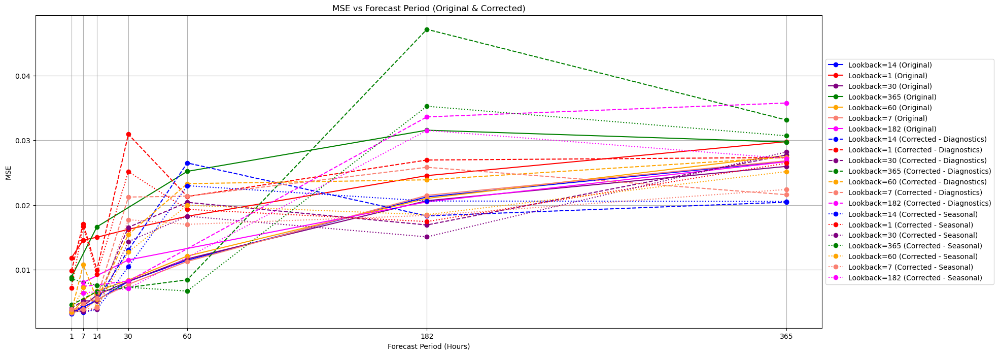

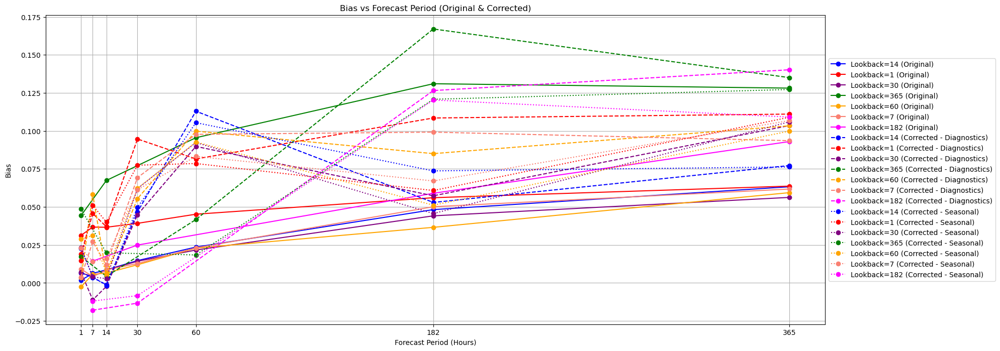

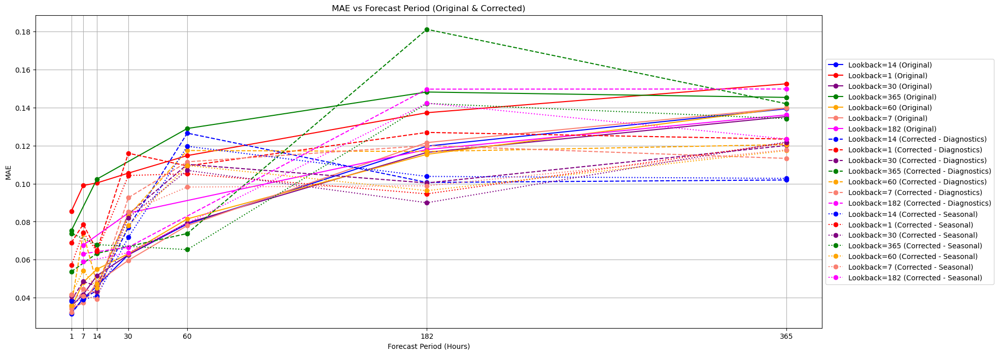

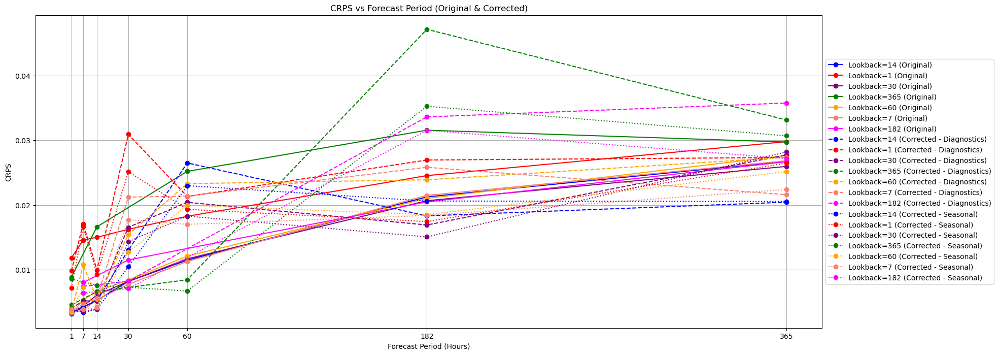

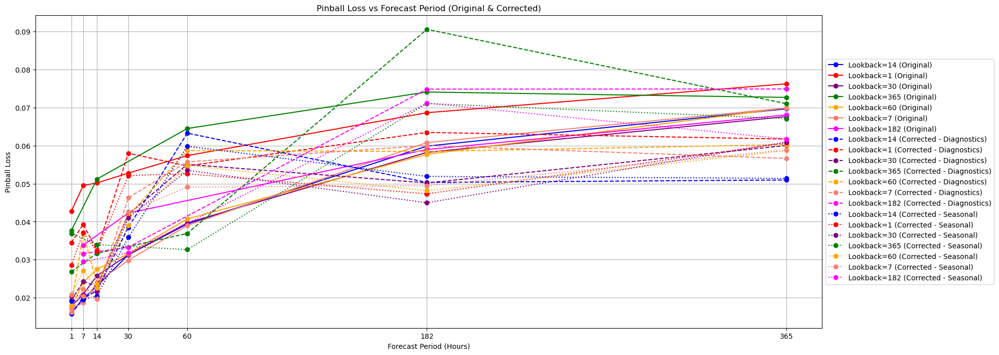

In [24]:
# 📊 Plot metrics with separate color lines for each Lookback (`lb`)
metrics = ["MSE", "Bias", "MAE", "CRPS", "Pinball Loss"]
colors = ["blue", "red", "purple", "green", "orange", "salmon", "magenta"]

# Assign unique colors for each lookback period across models
lookback_colors = {lb: colors[i % len(colors)] for i, lb in enumerate(results_univariate.keys())}
lookback_colors_corrected = {lb: colors[i % len(colors)] for i, lb in enumerate(results_diags.keys())}
lookback_colors_corrected_SEASON = {lb: colors[i % len(colors)] for i, lb in enumerate(results_season.keys())}

# Iterate over each metric
for metric in metrics:
    plt.figure(figsize=(20, 8))
    
    # 🎯 Plot Original Results (Univariate)
    for lookback, data in results_univariate.items():
        sorted_indices = np.argsort(data["Forecast Period"])
        x_sorted = np.array(data["Forecast Period"])[sorted_indices]
        y_sorted = np.array(data[metric])[sorted_indices]

        plt.plot(x_sorted, y_sorted, marker="o", linestyle="-", 
                 color=lookback_colors[lookback], label=f"Lookback={lookback} (Original)")

    # 📉 Plot Corrected Results (Diagnostics)
    for lookback, data in results_diags.items():
        sorted_indices = np.argsort(data["Forecast Period"])
        x_sorted = np.array(data["Forecast Period"])[sorted_indices]
        y_sorted = np.array(data[metric])[sorted_indices]

        plt.plot(x_sorted, y_sorted, marker="o", linestyle="--", 
                 color=lookback_colors_corrected[lookback], label=f"Lookback={lookback} (Corrected - Diagnostics)")
        
    # 🌍 Plot Corrected Results (Seasonal)
    for lookback, data in results_season.items():
        sorted_indices = np.argsort(data["Forecast Period"])
        x_sorted = np.array(data["Forecast Period"])[sorted_indices]
        y_sorted = np.array(data[metric])[sorted_indices]

        plt.plot(x_sorted, y_sorted, marker="o", linestyle=":", 
                 color=lookback_colors_corrected_SEASON[lookback], label=f"Lookback={lookback} (Corrected - Seasonal)")

    # 🎯 Labels & Formatting
    plt.xlabel("Forecast Period (Hours)")
    #plt.yscale("log")  # Log scale for better visualization of errors
    plt.ylabel(metric)
    plt.title(f"{metric} vs Forecast Period (Original & Corrected)")
    
    # 📌 Ensure consistent x-ticks
    all_x_ticks = sorted(set(sum([data["Forecast Period"] for data in results_univariate.values()], [])))
    plt.xticks(all_x_ticks)

    # 🔹 Legend Positioning
    plt.legend(loc="center left", bbox_to_anchor=(1, 0.5))
    plt.grid(True)
    
    # ✅ Set x-axis limits
    #plt.xlim(0, 60)  # Limits x-axis from 0 to 60
    
    # 📊 Show the Plot
    plt.show()


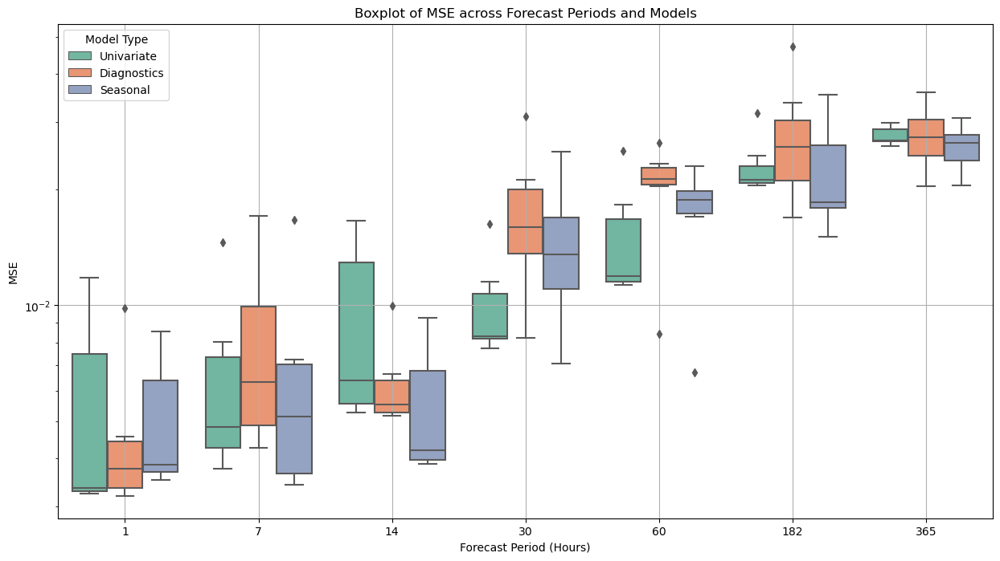

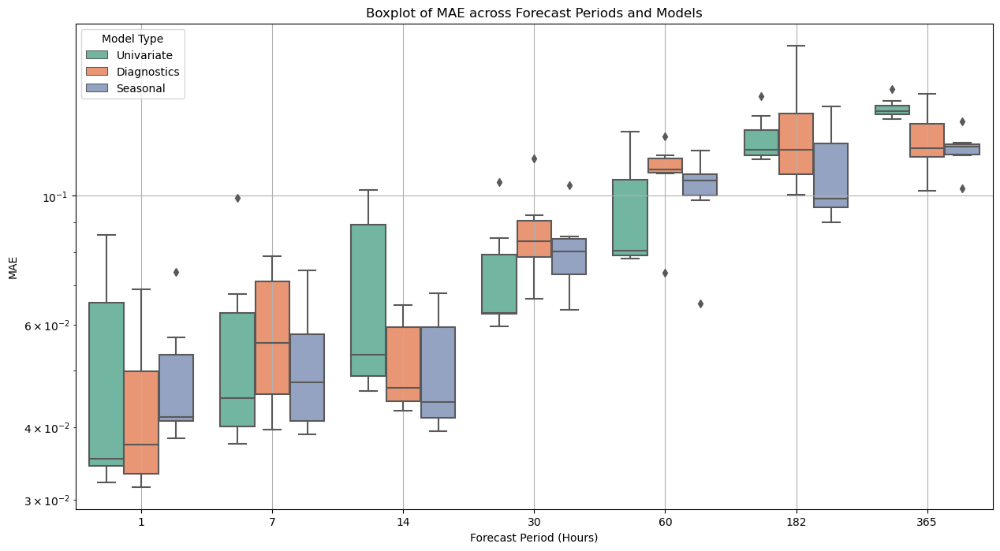

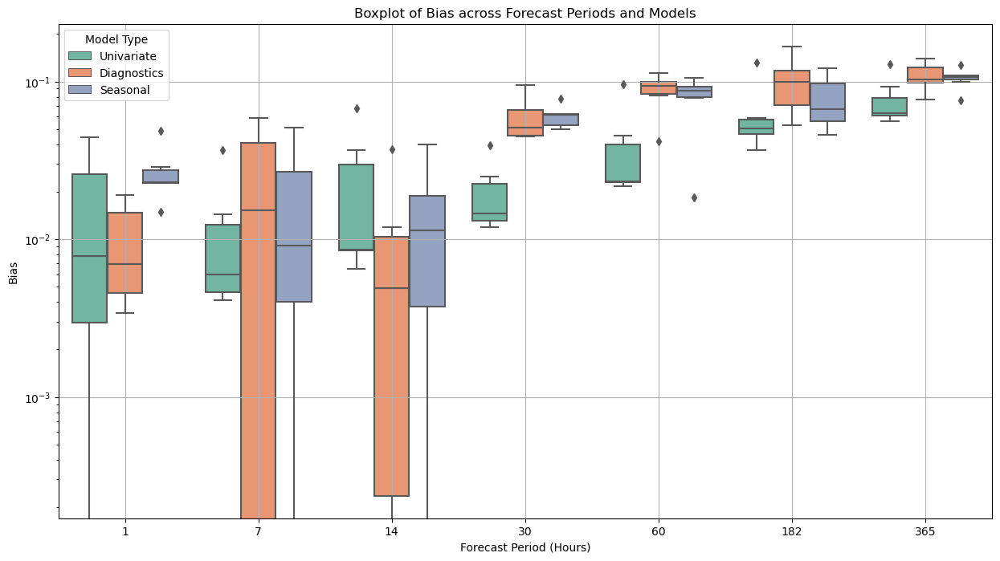

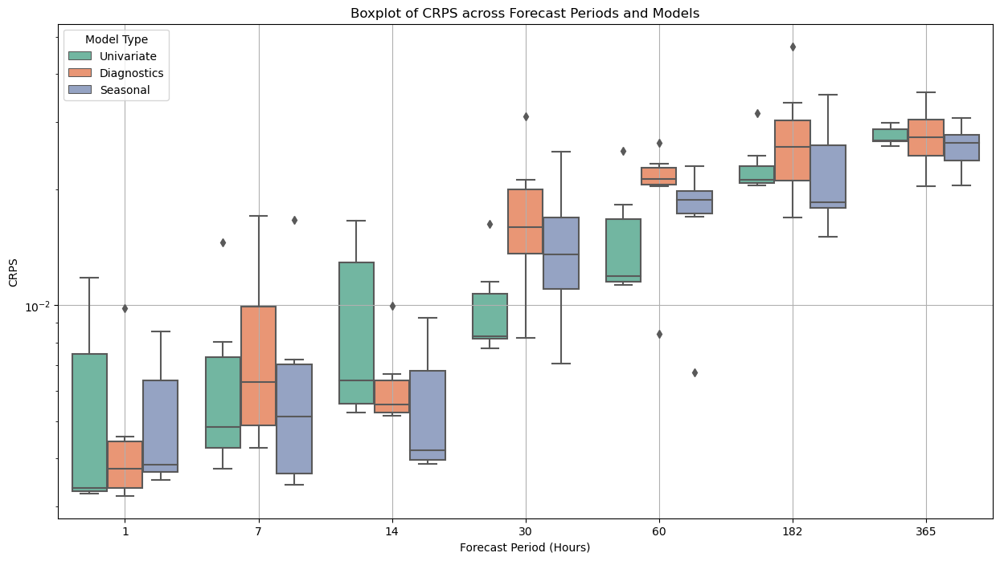

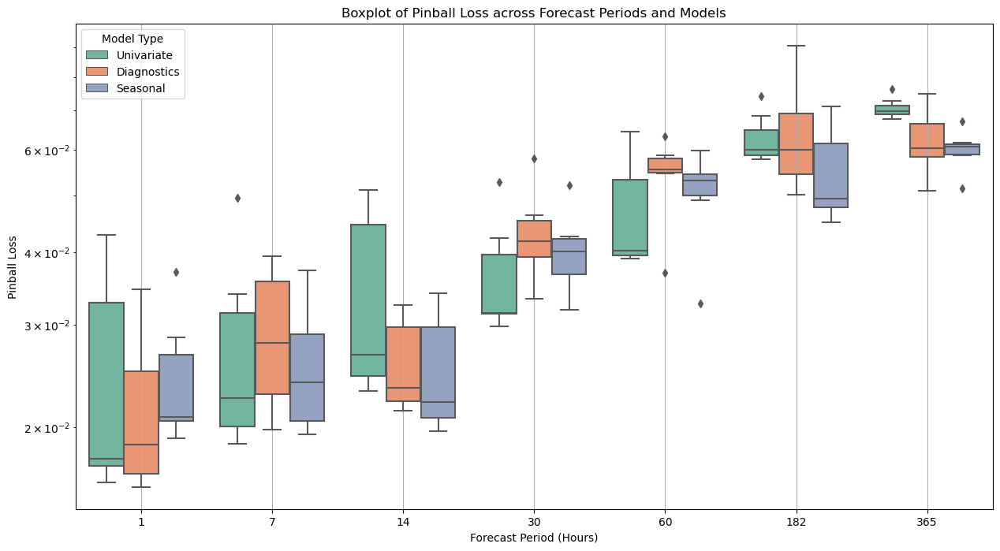

In [25]:
import seaborn as sns

# 📊 Flatten results into a DataFrame for easier plotting
def prepare_results_for_boxplot(results_dict, model_type):
    data = []
    for lookback, metrics in results_dict.items():
        for i, forecast in enumerate(metrics["Forecast Period"]):
            for metric in ["MSE", "MAE", "Bias", "CRPS", "Pinball Loss"]:
                data.append({
                    "Forecast": forecast,
                    "Lookback": lookback,
                    "Metric": metric,
                    "Value": metrics[metric][i],
                    "Model Type": model_type
                })
    return pd.DataFrame(data)

# 📑 Combine all results into a single DataFrame
df_univariate = prepare_results_for_boxplot(results_univariate, "Univariate")
df_diagnostics = prepare_results_for_boxplot(results_diags, "Diagnostics")
df_seasonal = prepare_results_for_boxplot(results_season, "Seasonal")

df_results = pd.concat([df_univariate, df_diagnostics, df_seasonal], ignore_index=True)

# 📈 Plot Boxplots for Each Metric
for metric in ["MSE", "MAE", "Bias", "CRPS", "Pinball Loss"]:
    plt.figure(figsize=(15, 8))
    
    # 🎨 Create a boxplot
    sns.boxplot(
        data=df_results[df_results["Metric"] == metric],
        x="Forecast",
        y="Value",
        hue="Model Type",
        palette="Set2"
    )
    
    plt.yscale("log")  # Log scale for better visualization
    plt.xlabel("Forecast Period (Hours)")
    plt.ylabel(metric)
    plt.title(f"Boxplot of {metric} across Forecast Periods and Models")
    plt.legend(title="Model Type")
    plt.grid(True)

    # 📊 Show the plot
    plt.show()

In [26]:
def prepare_results_for_boxplot(results_dict, model_type):
    data = []
    for lookback, metrics in results_dict.items():
        for i, forecast in enumerate(metrics["Forecast Period"]):
            for metric in ["MSE", "MAE", "Bias", "CRPS", "Pinball Loss"]:
                data.append({
                    "Forecast": forecast,
                    "Lookback": lookback,
                    "Metric": metric,
                    "Value": metrics[metric][i],
                    "Model Type": model_type
                })
    return pd.DataFrame(data)

# 📑 Combine all results into a single DataFrame
df_univariate = prepare_results_for_boxplot(results_univariate, "Univariate")
df_diagnostics = prepare_results_for_boxplot(results_diags, "Diagnostics")
df_seasonal = prepare_results_for_boxplot(results_season, "Seasonal")

df_results = pd.concat([df_univariate, df_diagnostics, df_seasonal], ignore_index=True)

# 📊 Function to compute percentage improvement over univariate model
def compute_improvement(df_results):
    improvements = []

    # Filter univariate results as a reference
    df_univariate = df_results[df_results["Model Type"] == "Univariate"]

    for forecast in df_results["Forecast"].unique():
        for lookback in df_results["Lookback"].unique():
            for metric in ["MSE", "MAE", "Bias", "CRPS", "Pinball Loss"]:
                # Get univariate baseline
                univariate_value = df_univariate[
                    (df_univariate["Forecast"] == forecast) & 
                    (df_univariate["Lookback"] == lookback) & 
                    (df_univariate["Metric"] == metric)
                ]["Value"]

                if univariate_value.empty:
                    continue  # Skip if no baseline exists

                univariate_value = univariate_value.values[0]

                # Get improved values (Diagnostics & Seasonal)
                df_sub = df_results[
                    (df_results["Forecast"] == forecast) & 
                    (df_results["Lookback"] == lookback) & 
                    (df_results["Metric"] == metric) & 
                    (df_results["Model Type"] != "Univariate")
                ]

                for _, row in df_sub.iterrows():
                    improvement = (univariate_value - row["Value"]) / univariate_value * 100  # % improvement
                    improvements.append({
                        "Forecast": forecast,
                        "Lookback": lookback,
                        "Metric": metric,
                        "Model Type": row["Model Type"],
                        "Improvement (%)": improvement
                    })

    return pd.DataFrame(improvements)

# 📑 Compute the improvement percentages
df_improvements = compute_improvement(df_results)

In [27]:
df_improvements_mse = df_improvements[df_improvements["Metric"] == "MSE"]

# 📊 Display a separate DataFrame for each forecast period
forecast_periods = df_improvements_mse["Forecast"].unique()

for forecast in sorted(forecast_periods):
    df_forecast = df_improvements_mse[df_improvements_mse["Forecast"] == forecast]
    display(df_forecast)

,Forecast,Lookback,Metric,Model Type,Improvement (%)
130,1,14,MSE,Diagnostics,1.171278
131,1,14,MSE,Seasonal,-17.047717
140,1,1,MSE,Diagnostics,17.014719
141,1,1,MSE,Seasonal,39.034019
150,1,30,MSE,Diagnostics,-19.497174
151,1,30,MSE,Seasonal,-8.457686
160,1,365,MSE,Diagnostics,48.662381
161,1,365,MSE,Seasonal,3.424406
170,1,60,MSE,Diagnostics,-6.699602
171,1,60,MSE,Seasonal,-7.674875


,Forecast,Lookback,Metric,Model Type,Improvement (%)
380,7,14,MSE,Diagnostics,-0.939106
381,7,14,MSE,Seasonal,19.153485
390,7,1,MSE,Diagnostics,-17.328454
391,7,1,MSE,Seasonal,-14.193727
400,7,30,MSE,Diagnostics,-19.080693
401,7,30,MSE,Seasonal,17.862330
410,7,60,MSE,Diagnostics,-102.535478
411,7,60,MSE,Seasonal,-36.070790
420,7,7,MSE,Diagnostics,-26.586550
421,7,7,MSE,Seasonal,-3.429991


,Forecast,Lookback,Metric,Model Type,Improvement (%)
0,14,14,MSE,Diagnostics,1.398554
1,14,14,MSE,Seasonal,26.536768
10,14,1,MSE,Diagnostics,33.723874
11,14,1,MSE,Seasonal,38.105735
20,14,30,MSE,Diagnostics,15.457006
21,14,30,MSE,Seasonal,35.777277
30,14,365,MSE,Diagnostics,60.167805
31,14,365,MSE,Seasonal,54.379190
40,14,60,MSE,Diagnostics,18.647849
41,14,60,MSE,Seasonal,35.862204


,Forecast,Lookback,Metric,Model Type,Improvement (%)
190,30,14,MSE,Diagnostics,-59.048633
191,30,14,MSE,Seasonal,-27.689580
200,30,1,MSE,Diagnostics,-90.435573
201,30,1,MSE,Seasonal,-54.820746
210,30,30,MSE,Diagnostics,-102.149960
211,30,30,MSE,Seasonal,-75.083773
220,30,60,MSE,Diagnostics,-84.055532
221,30,60,MSE,Seasonal,-51.781282
230,30,7,MSE,Diagnostics,-174.218694
231,30,7,MSE,Seasonal,-128.981023


,Forecast,Lookback,Metric,Model Type,Improvement (%)
320,60,14,MSE,Diagnostics,-130.797579
321,60,14,MSE,Seasonal,-100.194423
330,60,1,MSE,Diagnostics,-16.734181
331,60,1,MSE,Seasonal,-5.873532
340,60,30,MSE,Diagnostics,-74.772144
341,60,30,MSE,Seasonal,-56.475035
350,60,365,MSE,Diagnostics,66.500439
351,60,365,MSE,Seasonal,73.402676
360,60,60,MSE,Diagnostics,-92.416384
361,60,60,MSE,Seasonal,-64.837128


,Forecast,Lookback,Metric,Model Type,Improvement (%)
60,182,14,MSE,Diagnostics,13.808860
61,182,14,MSE,Seasonal,2.987946
70,182,1,MSE,Diagnostics,-9.818008
71,182,1,MSE,Seasonal,28.937372
80,182,30,MSE,Diagnostics,18.151871
81,182,30,MSE,Seasonal,27.062366
90,182,365,MSE,Diagnostics,-49.407017
91,182,365,MSE,Seasonal,-11.722334
100,182,60,MSE,Diagnostics,-13.678862
101,182,60,MSE,Seasonal,11.938595


,Forecast,Lookback,Metric,Model Type,Improvement (%)
250,365,14,MSE,Diagnostics,23.649065
251,365,14,MSE,Seasonal,23.241136
260,365,1,MSE,Diagnostics,8.216882
261,365,1,MSE,Seasonal,11.166823
270,365,30,MSE,Diagnostics,-6.817307
271,365,30,MSE,Seasonal,-8.593222
280,365,365,MSE,Diagnostics,-11.457220
281,365,365,MSE,Seasonal,-3.214259
290,365,60,MSE,Diagnostics,1.027378
291,365,60,MSE,Seasonal,9.001088


In [28]:
# 📊 Prepare a function to extract the best model per forecast period
def find_best_model_per_forecast(df_results, metric="MSE"):
    best_models = []
    
    # Iterate over unique forecast periods
    for forecast in sorted(df_results["Forecast"].unique()):
        subset = df_results[(df_results["Forecast"] == forecast) & (df_results["Metric"] == metric)]
        
        # Get the best (minimum) value of the metric
        best_value = subset["Value"].min()
        
        # Extract models with the best metric
        best_rows = subset[subset["Value"] == best_value]
        
        for _, row in best_rows.iterrows():
            best_models.append({
                "Forecast": forecast,
                "Lookback": row["Lookback"],
                "Model Type": row["Model Type"],
                "Best Metric Value": row["Value"]
            })
    
    return pd.DataFrame(best_models)

# 📑 Find best models for different metrics
best_mse_models = find_best_model_per_forecast(df_results, metric="MSE")
best_mae_models = find_best_model_per_forecast(df_results, metric="MAE")
best_crps_models = find_best_model_per_forecast(df_results, metric="CRPS")
best_pinball_models = find_best_model_per_forecast(df_results, metric="Pinball Loss")

# 📊 Display Results
display(best_mse_models)
display(best_mae_models)
display(best_crps_models)
display(best_pinball_models)

,Forecast,Lookback,Model Type,Best Metric Value
0,1,14,Diagnostics,0.003196
1,7,14,Seasonal,0.003413
2,14,14,Seasonal,0.003873
3,30,182,Seasonal,0.007070
4,60,365,Seasonal,0.006702
5,182,30,Seasonal,0.015071
6,365,14,Diagnostics,0.020435


,Forecast,Lookback,Model Type,Best Metric Value
0,1,14,Diagnostics,0.031535
1,7,7,Univariate,0.037386
2,14,7,Seasonal,0.039328
3,30,7,Univariate,0.059641
4,60,365,Seasonal,0.065279
5,182,30,Seasonal,0.089957
6,365,14,Diagnostics,0.101942


,Forecast,Lookback,Model Type,Best Metric Value
0,1,14,Diagnostics,0.003196
1,7,14,Seasonal,0.003413
2,14,14,Seasonal,0.003873
3,30,182,Seasonal,0.007070
4,60,365,Seasonal,0.006702
5,182,30,Seasonal,0.015071
6,365,14,Diagnostics,0.020435


,Forecast,Lookback,Model Type,Best Metric Value
0,1,14,Diagnostics,0.015767
1,7,7,Univariate,0.018693
2,14,7,Seasonal,0.019664
3,30,7,Univariate,0.029821
4,60,365,Seasonal,0.032639
5,182,30,Seasonal,0.044978
6,365,14,Diagnostics,0.050971


In [29]:
def plot_results(forecast, lookback):
    # directory definitions ........................................................................................
    univariate_base_path = "C:/Users/34648/OneDrive - Generalitat de Catalunya/Escriptori/waikato/univariate_models/"
    seasonal_base_path = "C:/Users/34648/OneDrive - Generalitat de Catalunya/Escriptori/waikato/seasonal_models/"
    diagnostics_base_path = "C:/Users/34648/OneDrive - Generalitat de Catalunya/Escriptori/waikato/diagnostics_models/"

    # MODELS NAMES .........................................................................................
    univariate_model_name = f'{code}_example_transformer_{forecast}fh_{ff_dim}ff_{lookback}lb_{learning_rate}initlr'
    diagnostics_covs_residual_models = f'{code}_DIAGNOSTICS_RESIDUALS_LEARNING_{forecast}fh_{ff_dim}ff_{lookback}lb_{learning_rate}initlr'
    seasonal_covs_residual_models = f'{code}_SEASONAL_RESIDUALS_LEARNING_{forecast}fh_{ff_dim}ff_{lookback}lb_{learning_rate}initlr'

    print("Univariate model folder:                           ",univariate_model_name)
    print("Diagnostics covariates lagged residuals models:    ",diagnostics_covs_residual_models)
    print("Seasonal covariates residuals models:              ",seasonal_covs_residual_models)

    # train and test datasets ..............................................................................

    csvFile_tr = f'{input_directory}diagnostic_data/{code}_train_example.csv'

    # prepare X and Y arrays
    X_test, Y_test = data_preparation.prepare_data(f'{input_directory}diagnostic_data/{code}_test_example.csv', 
                                                    lookback, forecast, debug=True, univariate =True)
    date_list_test = data_preparation.extract_dates(f'{input_directory}diagnostic_data/{code}_test_example.csv', 
                                                    lookback, forecast)

    finish_preparing = time.perf_counter()
    time_data_preparation = finish_preparing - start_time
    print("finished preparing data, time spent:",time_data_preparation)
    print("finished preparing timesteps test, time spent:",len(date_list_test))
    print("finished preparing timesteps train, time spent:",len(date_list_train))

    # DATA STEPS TO SEASONALLY REINDEX ........................................................................
    df_tst = pd.read_csv(csvFile_tst)

    # DIAG COVS shifted .......................................................................................
    df_covs = data_preparation.shift_covariates(df_filled, forecast) # shift all columns

    # Apply function to subset df_covs_TEST
    df_covs_subset_tst = data_preparation.subset_df_covs_by_index(df_tst, df_covs)
    df_covs_subset_tst.drop(columns=["timestamp"], inplace=True)    # drop the shifted date
    df_covs_subset_tst["timestamp"] = df_covs_subset_tst.index       # add new date (false one)
    df_covs_subset_tst = df_covs_subset_tst[['timestamp'] + [col for col in df_covs_subset_tst.columns if col != 'timestamp']]

    # SEASON COVS .............................................................................................
    categorical_vars = ["Day_of_Week", "Month", "Season", "Holiday", "School_Vacation"]

    # Call the function
    df_processed_tst = data_preparation.prepare_time_series_features(df_tst, categorical_vars)


    # UNIVARIATE MODELS ........................................................................................
    if full_path:
        modelUNI = tf.keras.models.load_model(os.path.join(univariate_base_path,univariate_model_name))


    # Get predictions test
    predictions_test = modelUNI.predict(X_test)
    print("Predicted test values:", predictions_test.shape)
    print("Real test values:", Y_test.shape)

    # Create new dataset for residual model
    Y_test_residual = Y_test - predictions_test

    print("Residuals shape test:", Y_test_residual.shape)
    print("Final residuals error calculated test :", Y_test_residual.mean(axis=1).mean())

    # DIAGNOSTICS COVARIATES MODELS ..............................................................................
    X_test_covs = data_preparation.generate_rolling_sequences_covariates(df_covs_subset_tst, lookback, forecast, predictions_test)

    # Verify shape
    print("Final Shape TEST COVS:", X_test_covs.shape)           # Should be (num_samples, forecast, num_features)
    print(f"Residuals Shapes TEST: X={Y_test_residual.shape}")  

    # model covariates
    model_COV = lagged_cov_models.build_hybrid_lstm_transformer(forecast, 
                                                                X_test_covs.shape, 
                                                                lagged_cov_models.transformer_encoder)
    # lagged model definition
    lagged_cov_models.train_given_model_and_data(model_COV, X_test_covs, Y_test_residual, 
                                                batch_size=32, 
                                                model_name=os.path.join(diagnostics_base_path, diagnostics_covs_residual_models),
                                                epochs=100, 
                                                save_model=True, save_memory=False, callbacks=None)

    modelDIAG = tf.keras.models.load_model(os.path.join(diagnostics_base_path, diagnostics_covs_residual_models))

    # Predict residuals for the test set
    predicted_test_residuals_DIAGS = modelDIAG.predict(X_test_covs)  # Shape: (num_samples, 14, 1)
    predicted_test_residuals_DIAGS = np.squeeze(predicted_test_residuals_DIAGS, axis=-1)

    # Correct the original forecast
    corrected_test_forecast_DIAG = predictions_test + predicted_test_residuals_DIAGS
    print("Predicted test values:            ", predictions_test.shape)
    print("Residuals shape test:             ", predicted_test_residuals_DIAGS.shape)
    print("corrected shape predictions test: ", corrected_test_forecast_DIAG.shape)

    # Create new dataset for residual model
    Y_test_residual = Y_test - predictions_test
    Y_test_bias = corrected_test_forecast_DIAG - Y_test

    print("Residuals shape test: ", Y_test_bias.shape)
    print("Final residuals error calculated test :", Y_test_residual.mean(axis=1).mean())
    print("Final bias error calculated test :     ", Y_test_bias.mean(axis=1).mean())

    # SEASONAL COVARIATES MODEL ................................................................................
    X_test_covs = data_preparation.generate_rolling_sequences_covariates(df_processed_tst, lookback, forecast, predictions_test)

    # Verify shape
    print("Final Shape TEST COVS:", X_test_covs.shape)           # Should be (num_samples, forecast, num_features)
    print(f"Residuals Shapes TEST: X={Y_test_residual.shape}")  

    # model covariates
    model_SEAS = seasonal_cov_models.build_hybrid_lstm_transformer(forecast, 
                                                                    X_test_covs.shape, 
                                                                    seasonal_cov_models.transformer_encoder)
    # lagged model definition
    seasonal_cov_models.train_given_model_and_data(model_SEAS, X_test_covs, Y_test_bias, 
                                                    batch_size=32, 
                                                    model_name=os.path.join(seasonal_base_path, seasonal_covs_residual_models),
                                                    epochs=100, 
                                                    save_model=True,save_memory=False, 
                                                    callbacks=None)

    modelSEAS = tf.keras.models.load_model(os.path.join(seasonal_base_path, seasonal_covs_residual_models))

    # Predict residuals for the test set
    predicted_test_bias_SEASONAL = modelSEAS.predict(X_test_covs)  # Shape: (num_samples, 14, 1)
    predicted_test_bias_SEASONAL = np.squeeze(predicted_test_bias_SEASONAL, axis=-1)

    # Correct the original forecast
    corrected_test_forecast_BIAS = corrected_test_forecast_DIAG - predicted_test_bias_SEASONAL
    print("Predicted test values:", corrected_test_forecast_DIAG.shape)
    print("Residuals shape test:", predicted_test_bias_SEASONAL.shape)
    print("corrected shape predictions test:", corrected_test_forecast_BIAS.shape)

    # TRAIN RESULTS ................................................................................................
    
    evaluation_plot_utils.plot_stepwise_errors(Y_test, predictions_test)
    evaluation_plot_utils.plot_stepwise_errors(Y_test, corrected_test_forecast_DIAG)
    evaluation_plot_utils.plot_stepwise_errors(Y_test, corrected_test_forecast_BIAS)

    evaluation_plot_utils.plot_predictions_with_waves(Y_test.mean(axis=1), predictions_test.mean(axis=1), 
                                                  date_list_test, df_waves, waves=True)
    evaluation_plot_utils.plot_predictions_with_waves(Y_test.mean(axis=1), corrected_test_forecast_DIAG.mean(axis=1), 
                                                  date_list_test, df_waves, waves=True)
    evaluation_plot_utils.plot_predictions_with_waves(Y_test.mean(axis=1), corrected_test_forecast_BIAS.mean(axis=1), 
                                                  date_list_test, df_waves, waves=True)

In [30]:
waves = {
    "Primera Onada": ("2020-03", "2020-06"),
    "Segona Onada": ("2020-10", "2020-12"),
    "Tercera Onada": ("2021-01", "2021-03"),
    "Quarta Onada": ("2021-04", "2021-06"),
    "Cinquena Onada": ("2021-07", "2021-09")
}

# Convertir a DataFrame per facilitar la representació
df_waves = pd.DataFrame(waves).T.reset_index()
df_waves.columns = ["Onada", "Inici", "Final"]
df_waves["Inici"] = pd.to_datetime(df_waves["Inici"])
df_waves["Final"] = pd.to_datetime(df_waves["Final"])

Univariate model folder:                            J00_example_transformer_1fh_8ff_365lb_0.001initlr
Diagnostics covariates lagged residuals models:     J00_DIAGNOSTICS_RESIDUALS_LEARNING_1fh_8ff_365lb_0.001initlr
Seasonal covariates residuals models:               J00_SEASONAL_RESIDUALS_LEARNING_1fh_8ff_365lb_0.001initlr
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840 entries, 0 to 839
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   timestamp  840 non-null    object 
 1   J00        840 non-null    float64
dtypes: float64(1), object(1)
memory usage: 13.2+ KB
Processed Data Shapes: X=(475, 365, 1), Y=(475, 1)
finished preparing data, time spent: 19.948056199999996
finished preparing timesteps test, time spent: 475
finished preparing timesteps train, time spent: 3323
Predicted test values: (475, 1)
Real test values: (475, 1)
Residuals shape test: (475, 1)
Final residuals error calculated test : -0.04430131996799

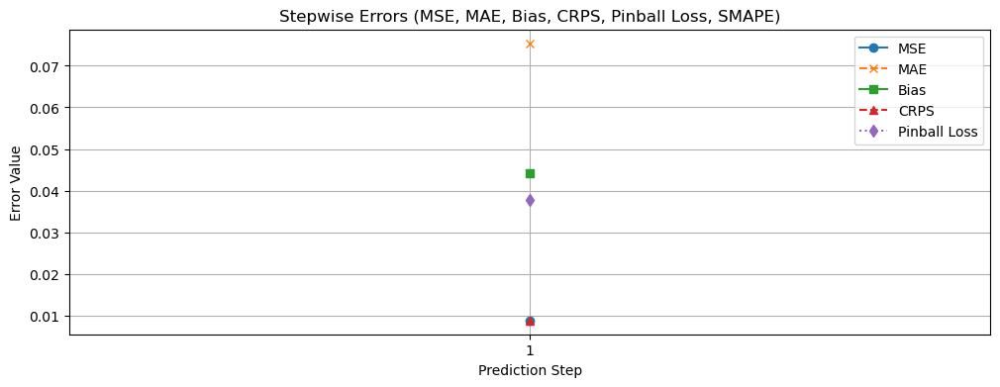

🔹 **Average MSE:** 0.0046
🔹 **Average MAE:** 0.0537
🔹 **Average Bias:** 0.0173
🔹 **Average CRPS:** 0.0046
🔹 **Average Pinball Loss:** 0.0269
🔹 **Average SMAPE:** 81.28%


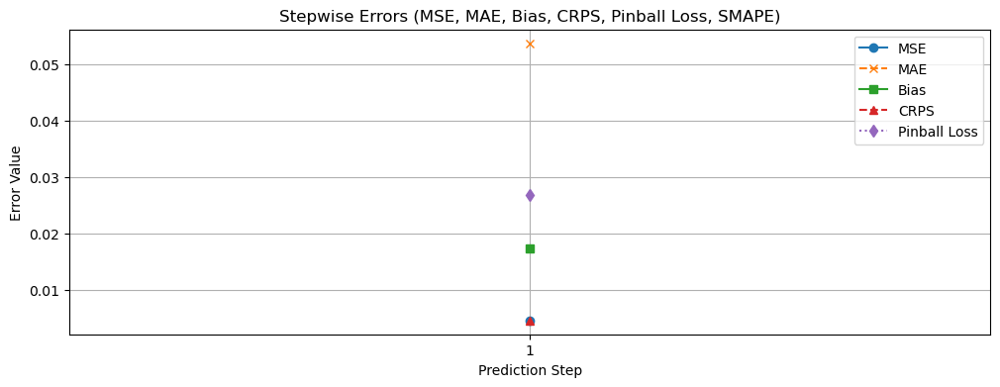

🔹 **Average MSE:** 0.0086
🔹 **Average MAE:** 0.0742
🔹 **Average Bias:** 0.0490
🔹 **Average CRPS:** 0.0086
🔹 **Average Pinball Loss:** 0.0371
🔹 **Average SMAPE:** 89.55%


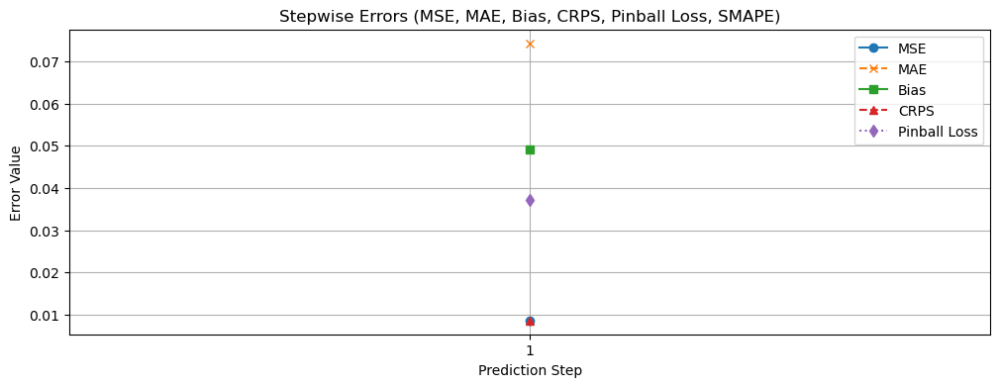

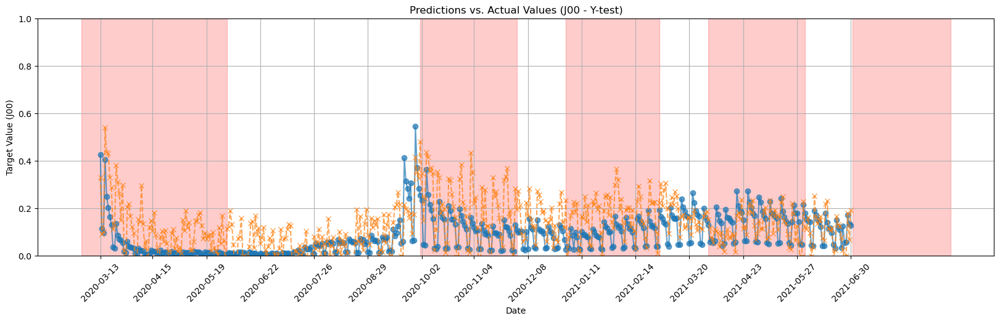

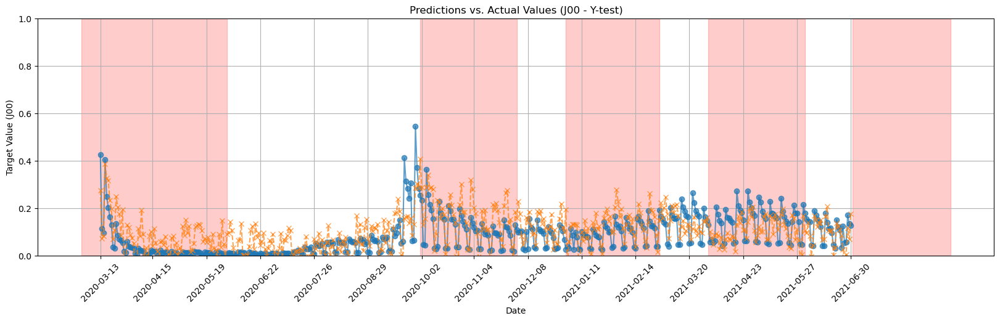

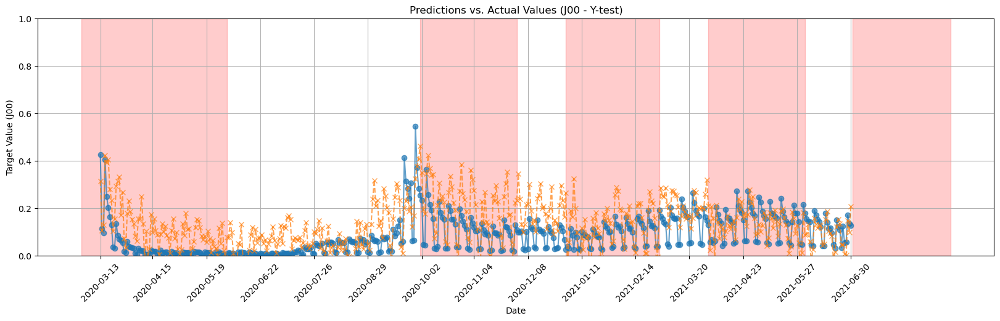

In [31]:
plot_results(1, 365)

Univariate model folder:                            J00_example_transformer_7fh_8ff_182lb_0.001initlr
Diagnostics covariates lagged residuals models:     J00_DIAGNOSTICS_RESIDUALS_LEARNING_7fh_8ff_182lb_0.001initlr
Seasonal covariates residuals models:               J00_SEASONAL_RESIDUALS_LEARNING_7fh_8ff_182lb_0.001initlr
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840 entries, 0 to 839
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   timestamp  840 non-null    object 
 1   J00        840 non-null    float64
dtypes: float64(1), object(1)
memory usage: 13.2+ KB
Processed Data Shapes: X=(652, 182, 1), Y=(652, 7)
finished preparing data, time spent: 34.65087840000001
finished preparing timesteps test, time spent: 652
finished preparing timesteps train, time spent: 3323
Predicted test values: (652, 7)
Real test values: (652, 7)
Residuals shape test: (652, 7)
Final residuals error calculated test : -0.014375592728044

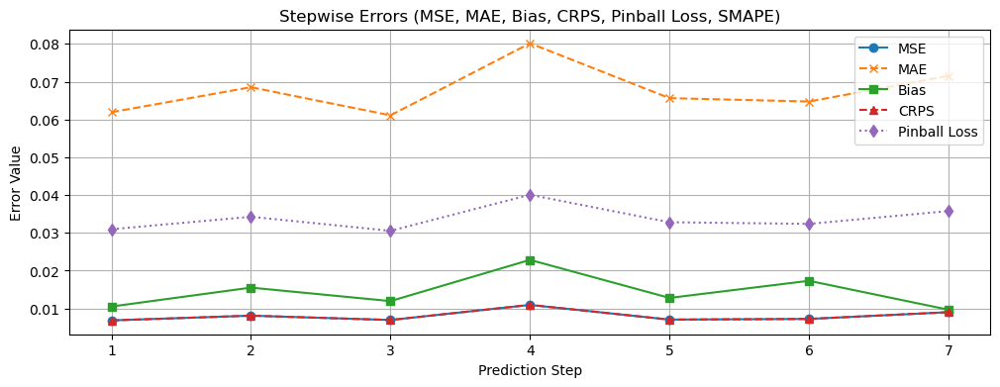

🔹 **Average MSE:** 0.0074
🔹 **Average MAE:** 0.0631
🔹 **Average Bias:** -0.0179
🔹 **Average CRPS:** 0.0074
🔹 **Average Pinball Loss:** 0.0316
🔹 **Average SMAPE:** 72.33%


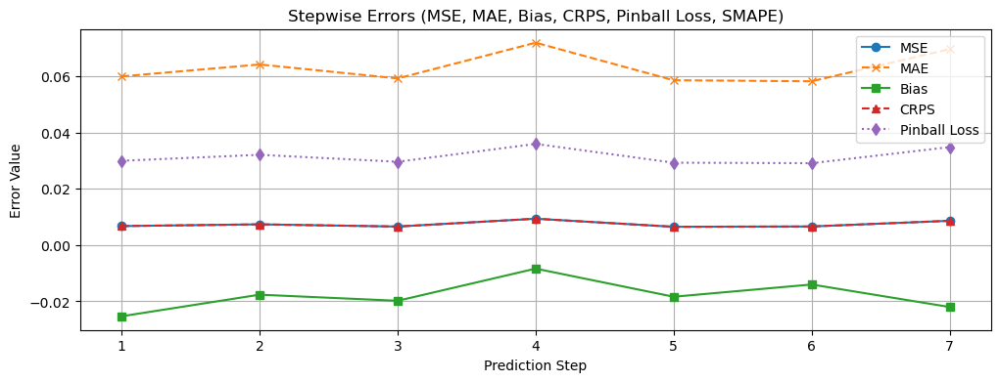

🔹 **Average MSE:** 0.0064
🔹 **Average MAE:** 0.0589
🔹 **Average Bias:** -0.0118
🔹 **Average CRPS:** 0.0064
🔹 **Average Pinball Loss:** 0.0294
🔹 **Average SMAPE:** 69.01%


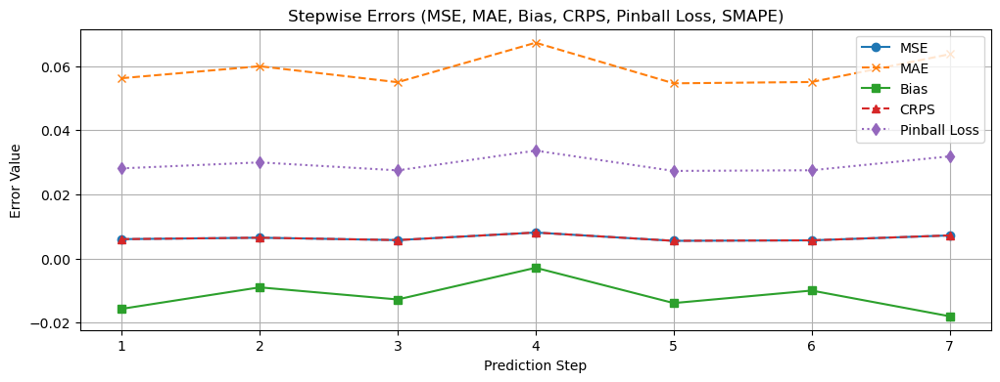

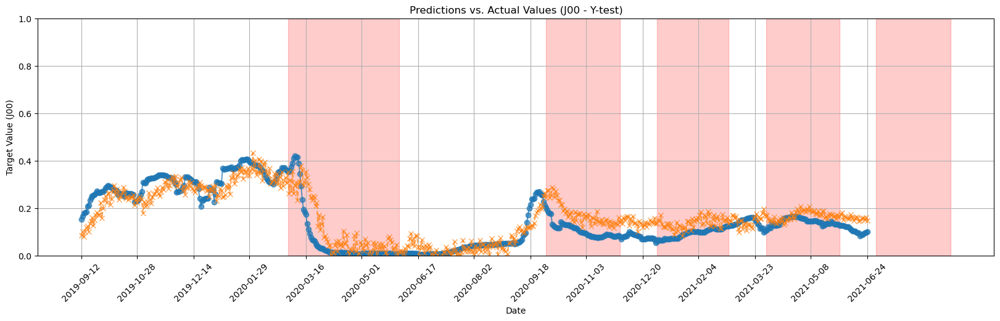

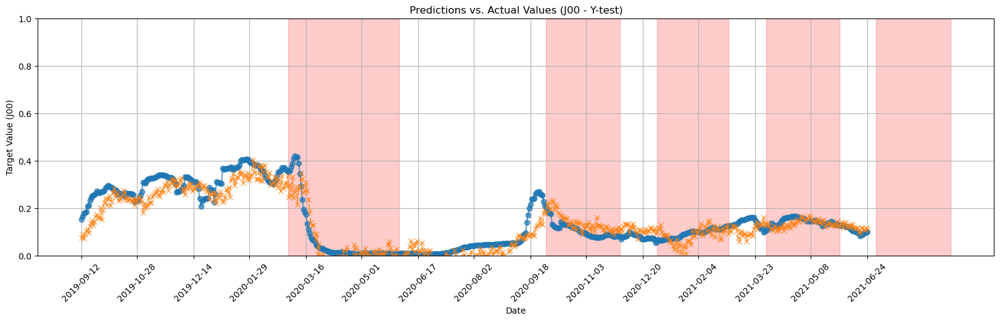

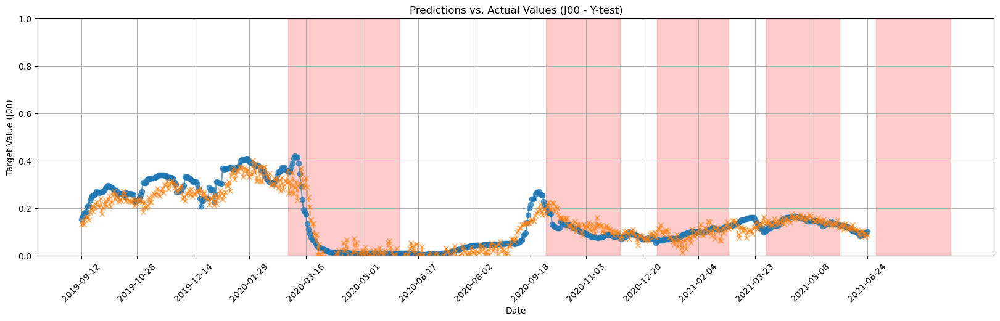

In [32]:
plot_results(7, 182)

Univariate model folder:                            J00_example_transformer_14fh_8ff_365lb_0.001initlr
Diagnostics covariates lagged residuals models:     J00_DIAGNOSTICS_RESIDUALS_LEARNING_14fh_8ff_365lb_0.001initlr
Seasonal covariates residuals models:               J00_SEASONAL_RESIDUALS_LEARNING_14fh_8ff_365lb_0.001initlr
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840 entries, 0 to 839
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   timestamp  840 non-null    object 
 1   J00        840 non-null    float64
dtypes: float64(1), object(1)
memory usage: 13.2+ KB
Processed Data Shapes: X=(462, 365, 1), Y=(462, 14)
finished preparing data, time spent: 48.61046939999994
finished preparing timesteps test, time spent: 462
finished preparing timesteps train, time spent: 3323
Predicted test values: (462, 14)
Real test values: (462, 14)
Residuals shape test: (462, 14)
Final residuals error calculated test : -0.06739654

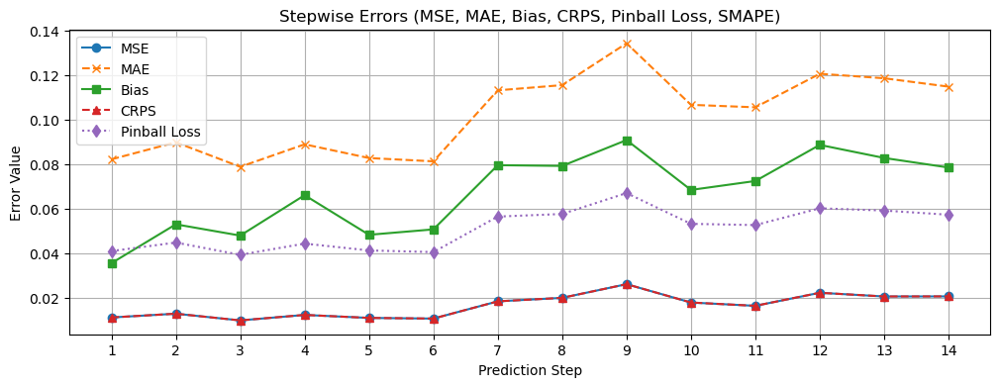

🔹 **Average MSE:** 0.0066
🔹 **Average MAE:** 0.0633
🔹 **Average Bias:** 0.0043
🔹 **Average CRPS:** 0.0066
🔹 **Average Pinball Loss:** 0.0317
🔹 **Average SMAPE:** 92.60%


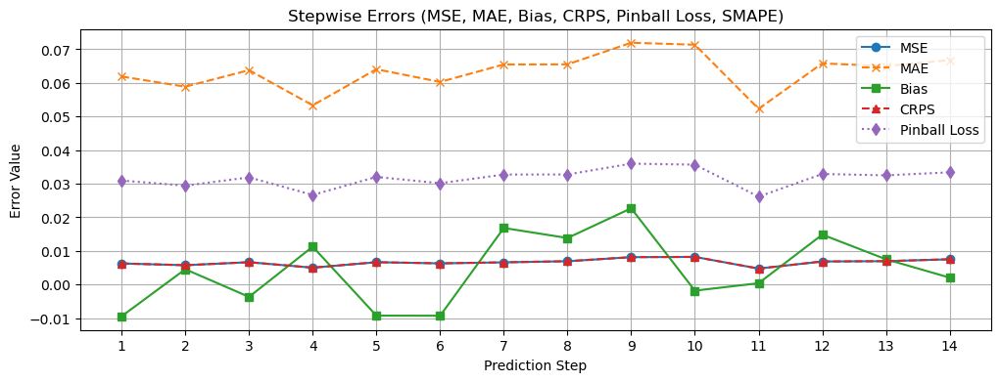

🔹 **Average MSE:** 0.0075
🔹 **Average MAE:** 0.0676
🔹 **Average Bias:** 0.0187
🔹 **Average CRPS:** 0.0075
🔹 **Average Pinball Loss:** 0.0338
🔹 **Average SMAPE:** 92.39%


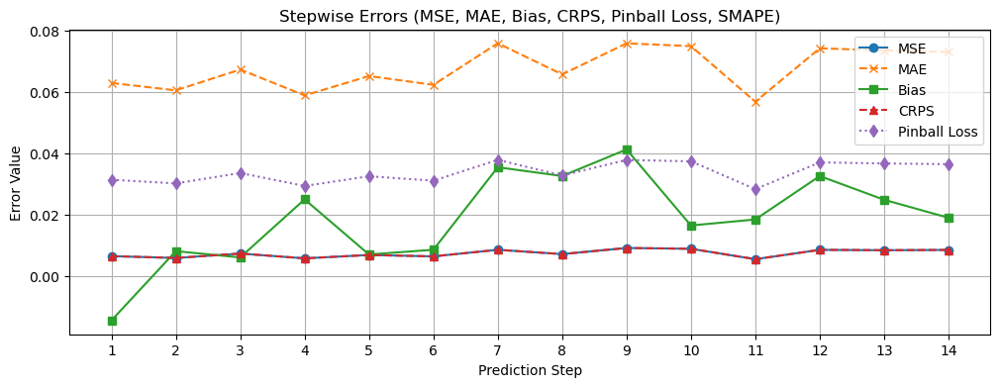

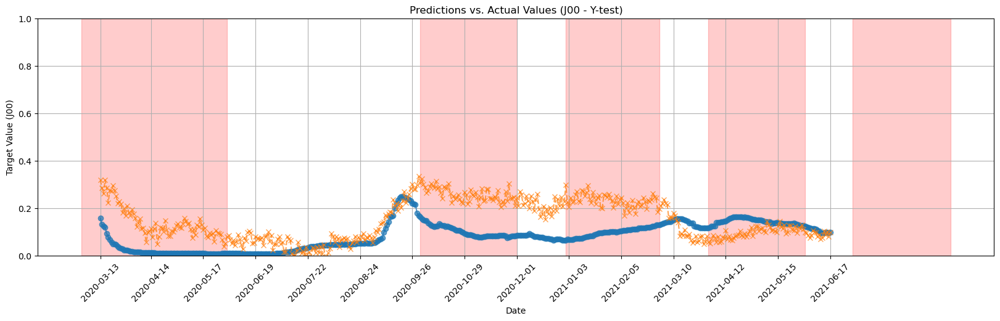

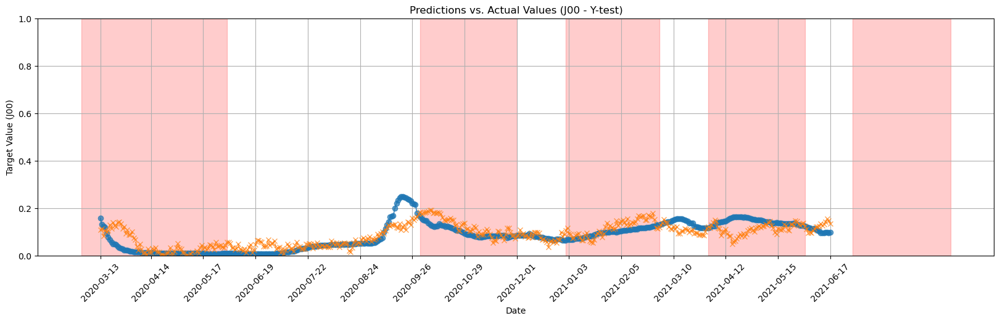

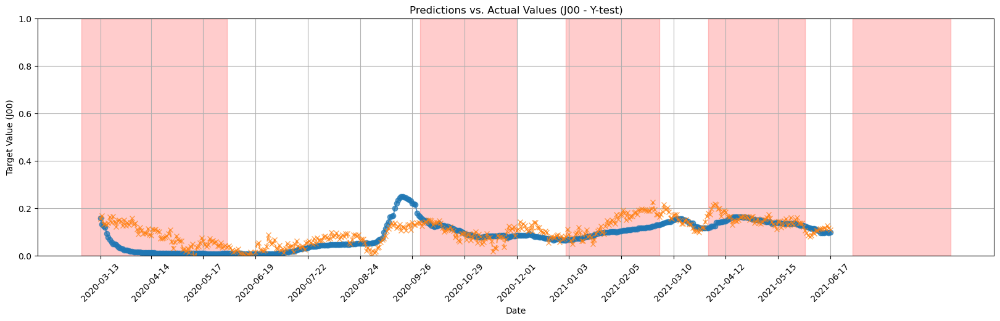

In [33]:
plot_results(14, 365)

Univariate model folder:                            J00_example_transformer_30fh_8ff_182lb_0.001initlr
Diagnostics covariates lagged residuals models:     J00_DIAGNOSTICS_RESIDUALS_LEARNING_30fh_8ff_182lb_0.001initlr
Seasonal covariates residuals models:               J00_SEASONAL_RESIDUALS_LEARNING_30fh_8ff_182lb_0.001initlr
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840 entries, 0 to 839
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   timestamp  840 non-null    object 
 1   J00        840 non-null    float64
dtypes: float64(1), object(1)
memory usage: 13.2+ KB
Processed Data Shapes: X=(629, 182, 1), Y=(629, 30)
finished preparing data, time spent: 63.41614509999988
finished preparing timesteps test, time spent: 629
finished preparing timesteps train, time spent: 3323
Predicted test values: (629, 30)
Real test values: (629, 30)
Residuals shape test: (629, 30)
Final residuals error calculated test : -0.02492261

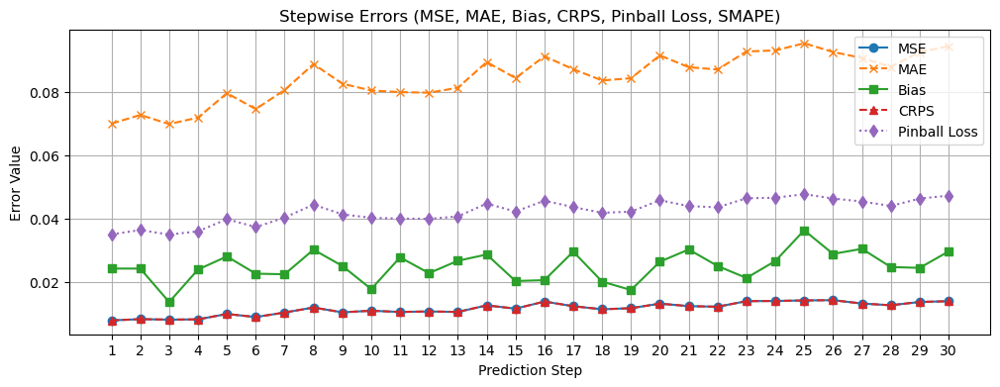

🔹 **Average MSE:** 0.0082
🔹 **Average MAE:** 0.0665
🔹 **Average Bias:** -0.0133
🔹 **Average CRPS:** 0.0082
🔹 **Average Pinball Loss:** 0.0333
🔹 **Average SMAPE:** 72.40%


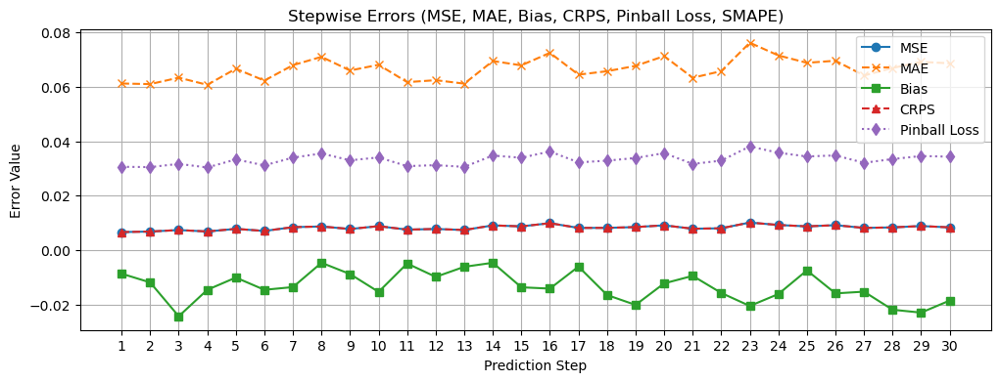

🔹 **Average MSE:** 0.0071
🔹 **Average MAE:** 0.0636
🔹 **Average Bias:** -0.0090
🔹 **Average CRPS:** 0.0071
🔹 **Average Pinball Loss:** 0.0318
🔹 **Average SMAPE:** 71.32%


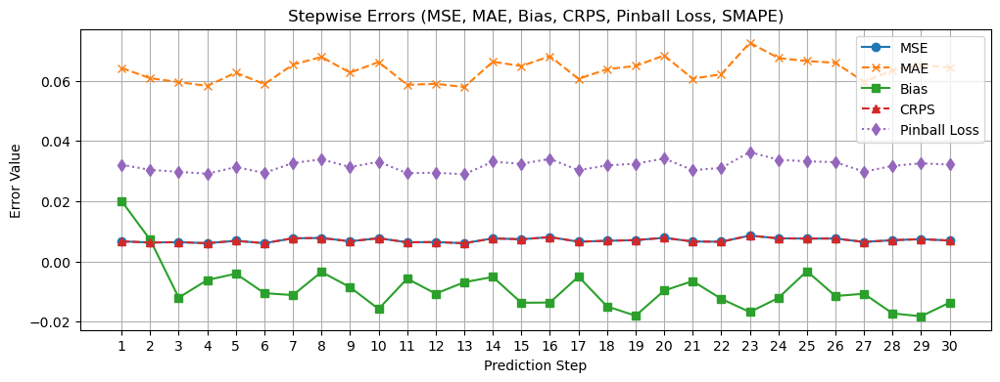

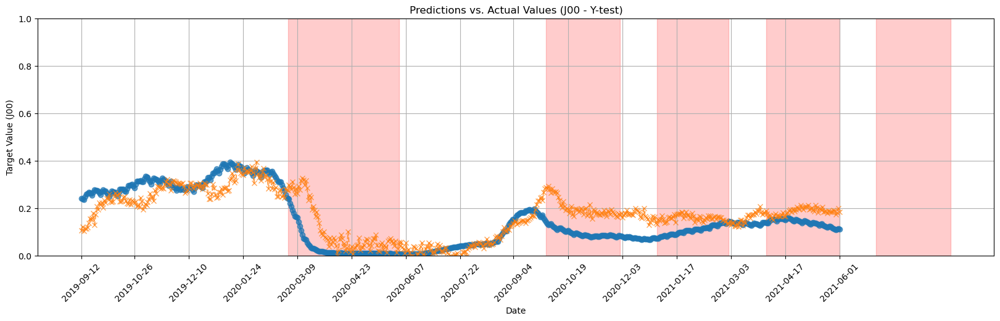

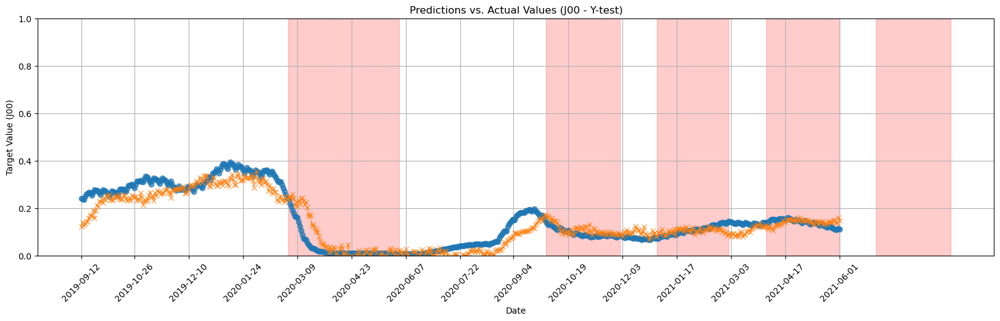

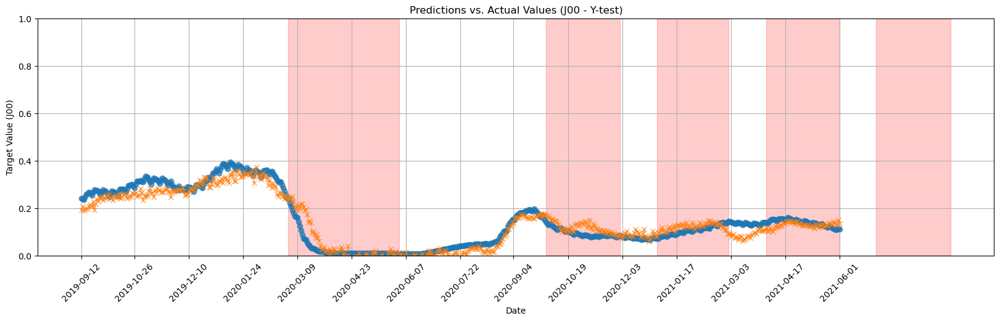

In [34]:
plot_results(30, 182)

Univariate model folder:                            J00_example_transformer_60fh_8ff_365lb_0.001initlr
Diagnostics covariates lagged residuals models:     J00_DIAGNOSTICS_RESIDUALS_LEARNING_60fh_8ff_365lb_0.001initlr
Seasonal covariates residuals models:               J00_SEASONAL_RESIDUALS_LEARNING_60fh_8ff_365lb_0.001initlr
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840 entries, 0 to 839
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   timestamp  840 non-null    object 
 1   J00        840 non-null    float64
dtypes: float64(1), object(1)
memory usage: 13.2+ KB
Processed Data Shapes: X=(416, 365, 1), Y=(416, 60)
finished preparing data, time spent: 77.86883890000001
finished preparing timesteps test, time spent: 416
finished preparing timesteps train, time spent: 3323
Predicted test values: (416, 60)
Real test values: (416, 60)
Residuals shape test: (416, 60)
Final residuals error calculated test : -0.09551344

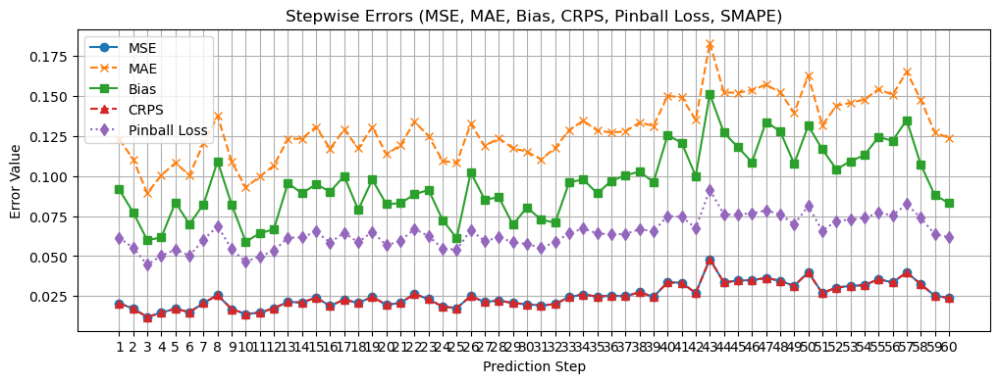

🔹 **Average MSE:** 0.0084
🔹 **Average MAE:** 0.0738
🔹 **Average Bias:** 0.0417
🔹 **Average CRPS:** 0.0084
🔹 **Average Pinball Loss:** 0.0369
🔹 **Average SMAPE:** 89.83%


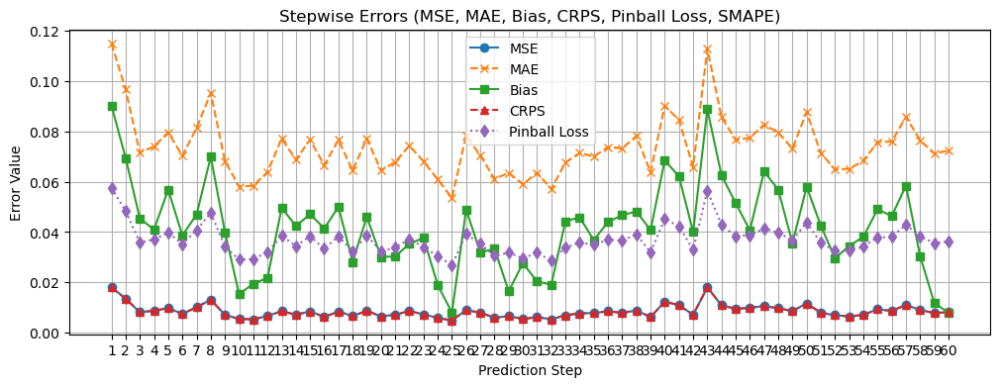

🔹 **Average MSE:** 0.0068
🔹 **Average MAE:** 0.0659
🔹 **Average Bias:** 0.0206
🔹 **Average CRPS:** 0.0068
🔹 **Average Pinball Loss:** 0.0329
🔹 **Average SMAPE:** 90.48%


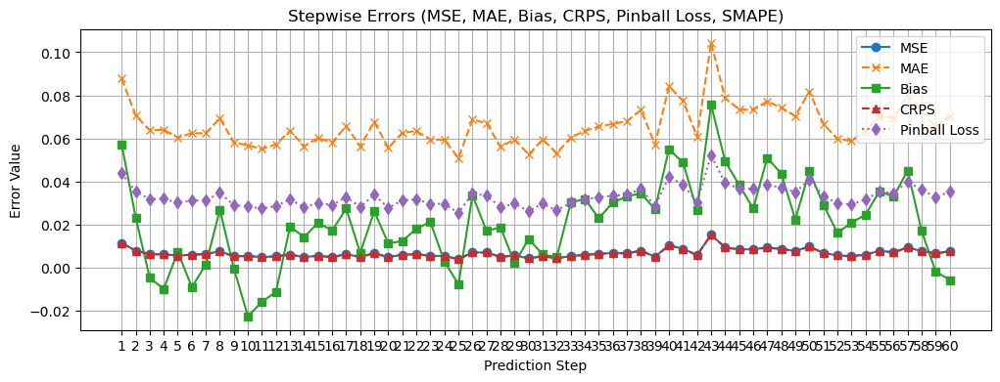

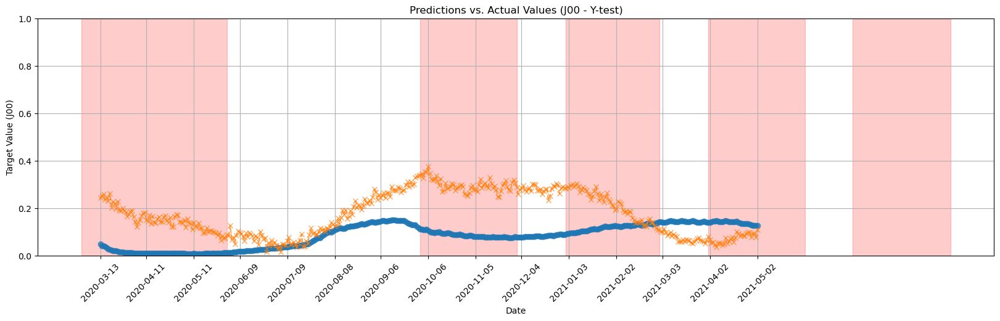

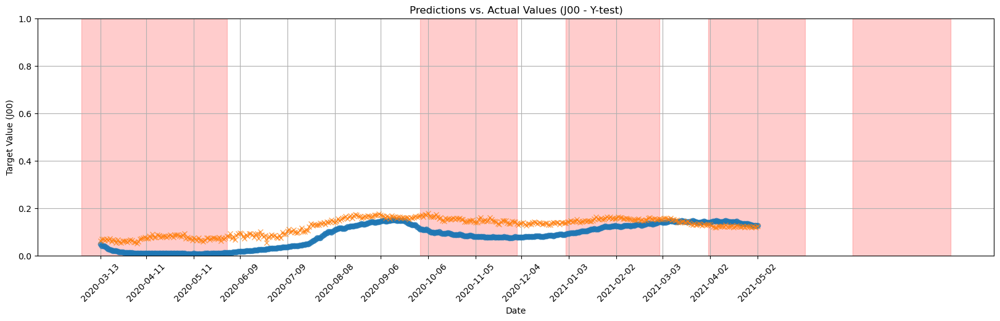

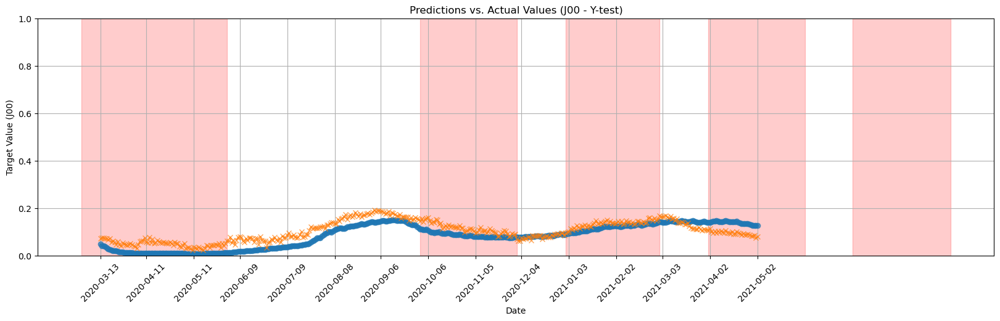

In [35]:
plot_results(60, 365)

Univariate model folder:                            J00_example_transformer_182fh_8ff_30lb_0.001initlr
Diagnostics covariates lagged residuals models:     J00_DIAGNOSTICS_RESIDUALS_LEARNING_182fh_8ff_30lb_0.001initlr
Seasonal covariates residuals models:               J00_SEASONAL_RESIDUALS_LEARNING_182fh_8ff_30lb_0.001initlr
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840 entries, 0 to 839
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   timestamp  840 non-null    object 
 1   J00        840 non-null    float64
dtypes: float64(1), object(1)
memory usage: 13.2+ KB
Processed Data Shapes: X=(629, 30, 1), Y=(629, 182)
finished preparing data, time spent: 95.09647979999988
finished preparing timesteps test, time spent: 629
finished preparing timesteps train, time spent: 3323
Predicted test values: (629, 182)
Real test values: (629, 182)
Residuals shape test: (629, 182)
Final residuals error calculated test : -0.04413

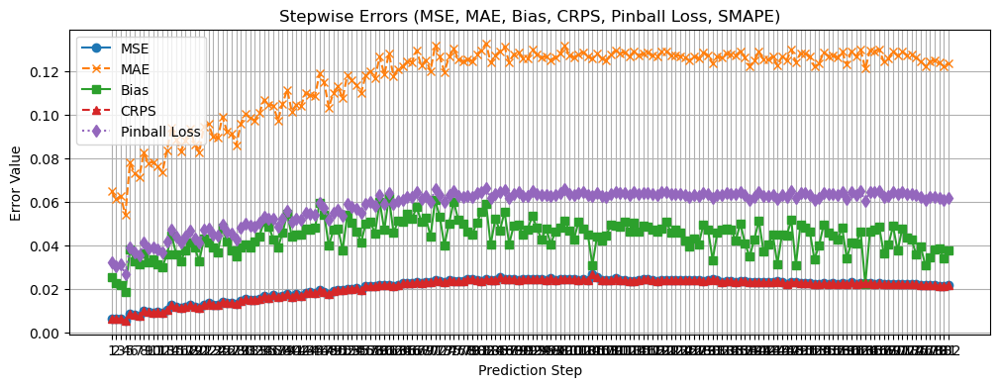

🔹 **Average MSE:** 0.0169
🔹 **Average MAE:** 0.1004
🔹 **Average Bias:** 0.0573
🔹 **Average CRPS:** 0.0169
🔹 **Average Pinball Loss:** 0.0502
🔹 **Average SMAPE:** 79.12%


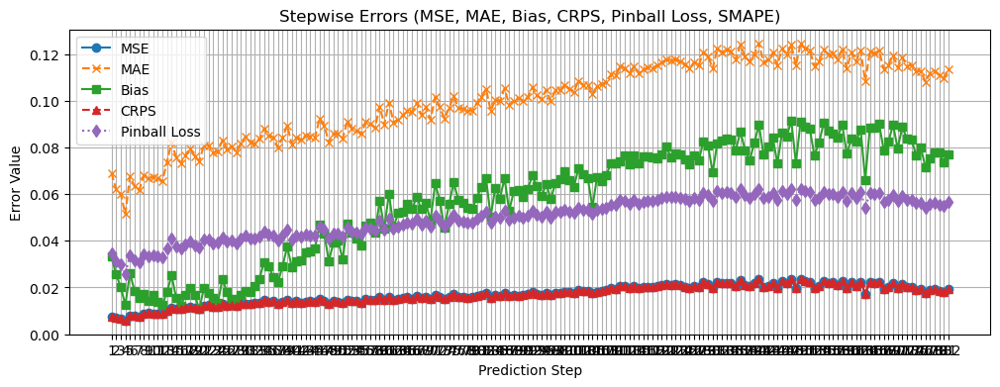

🔹 **Average MSE:** 0.0163
🔹 **Average MAE:** 0.0923
🔹 **Average Bias:** 0.0453
🔹 **Average CRPS:** 0.0163
🔹 **Average Pinball Loss:** 0.0462
🔹 **Average SMAPE:** 82.64%


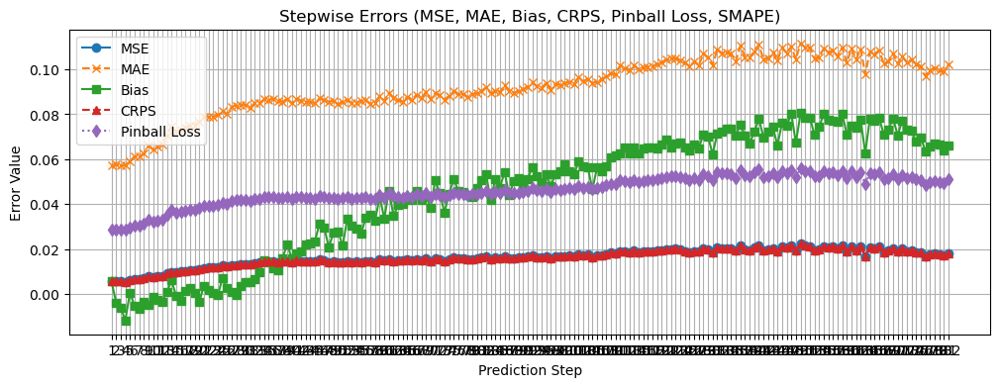

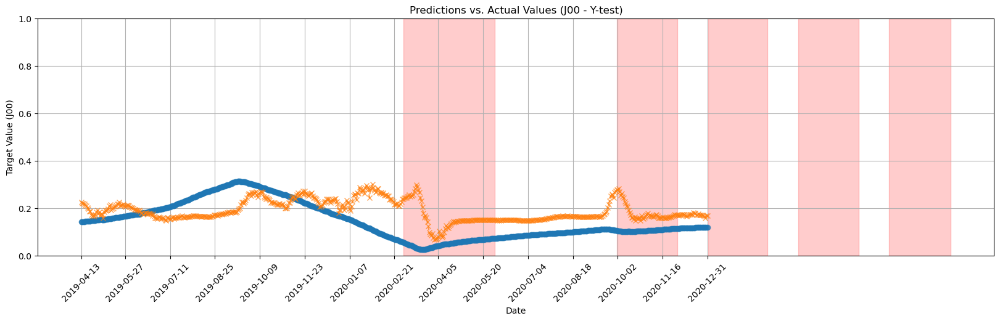

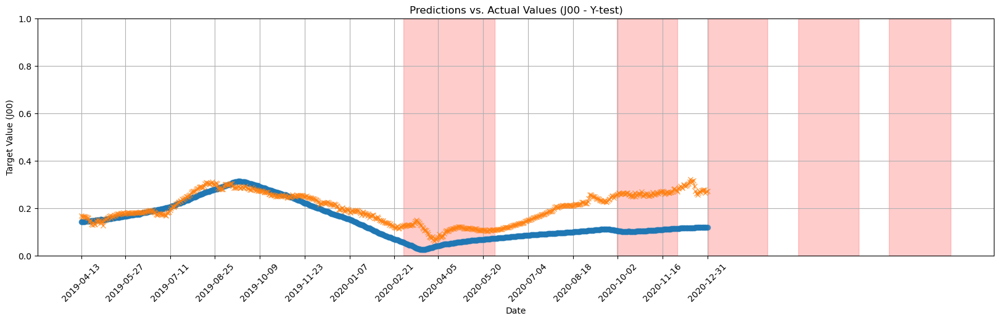

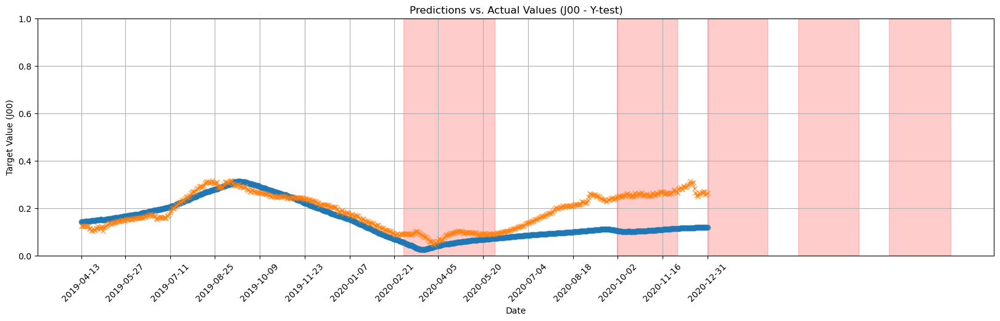

In [36]:
plot_results(182, 30)

Univariate model folder:                            J00_example_transformer_365fh_8ff_14lb_0.001initlr
Diagnostics covariates lagged residuals models:     J00_DIAGNOSTICS_RESIDUALS_LEARNING_365fh_8ff_14lb_0.001initlr
Seasonal covariates residuals models:               J00_SEASONAL_RESIDUALS_LEARNING_365fh_8ff_14lb_0.001initlr
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840 entries, 0 to 839
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   timestamp  840 non-null    object 
 1   J00        840 non-null    float64
dtypes: float64(1), object(1)
memory usage: 13.2+ KB
Processed Data Shapes: X=(462, 14, 1), Y=(462, 365)
finished preparing data, time spent: 118.37924229999987
finished preparing timesteps test, time spent: 462
finished preparing timesteps train, time spent: 3323
Predicted test values: (462, 365)
Real test values: (462, 365)
Residuals shape test: (462, 365)
Final residuals error calculated test : -0.0632

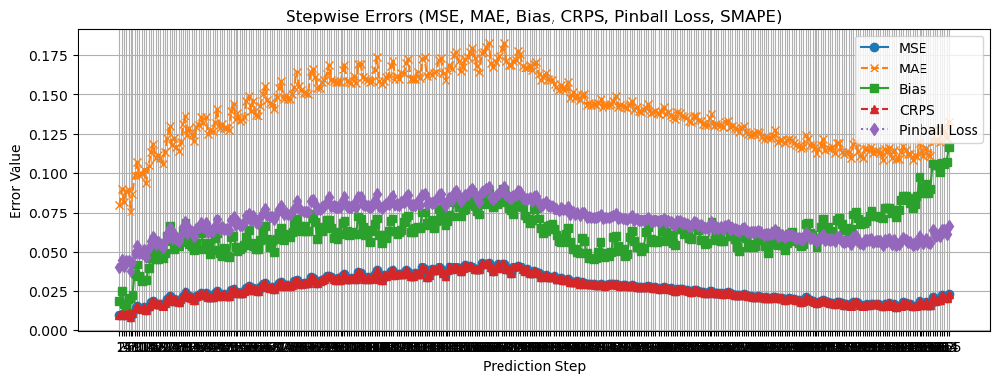

🔹 **Average MSE:** 0.0204
🔹 **Average MAE:** 0.1019
🔹 **Average Bias:** 0.0772
🔹 **Average CRPS:** 0.0204
🔹 **Average Pinball Loss:** 0.0510
🔹 **Average SMAPE:** 81.20%


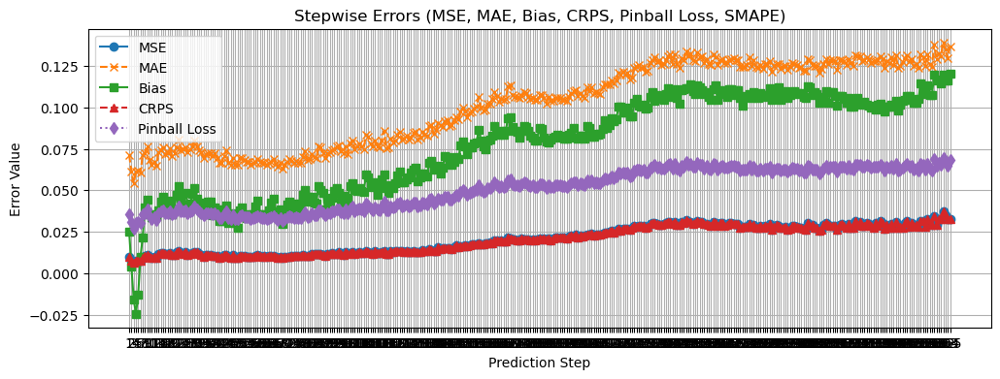

🔹 **Average MSE:** 0.0209
🔹 **Average MAE:** 0.1031
🔹 **Average Bias:** 0.0772
🔹 **Average CRPS:** 0.0209
🔹 **Average Pinball Loss:** 0.0515
🔹 **Average SMAPE:** 82.44%


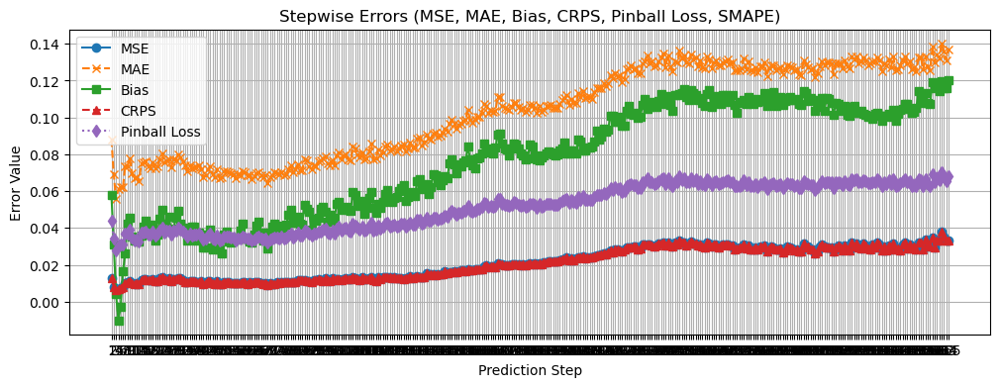

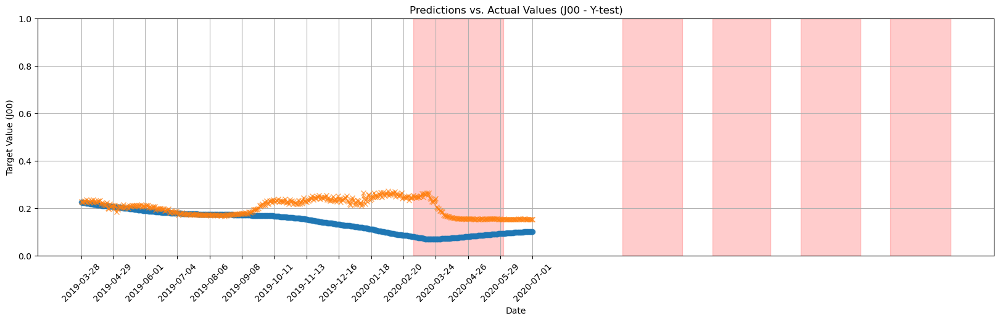

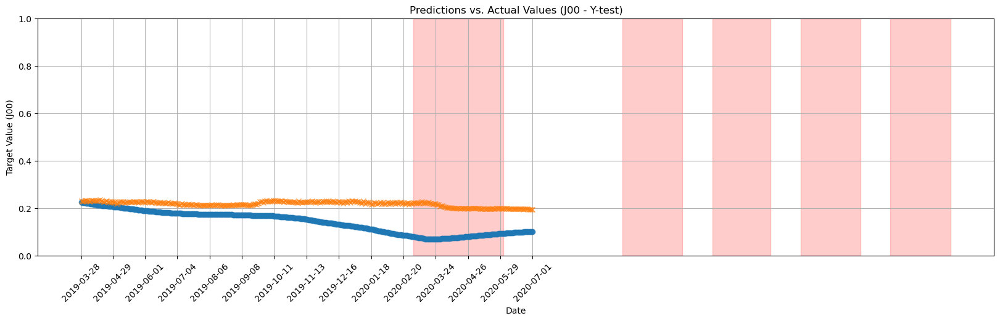

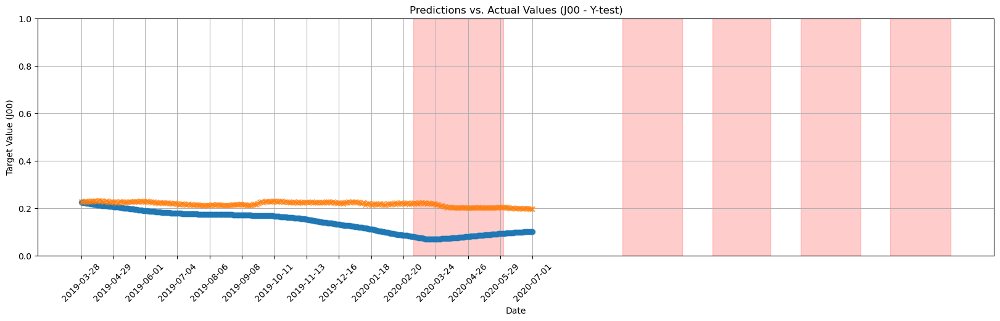

In [37]:
plot_results(365, 14)